# Pipeline-3

In [17]:
import h5py
import numpy as np
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from gensim import corpora
from gensim.models import LdaModel
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter



In [ ]:
# Function to load embeddings and sentences from HDF5 files
def load_embeddings_and_sentences(file_paths):
    all_embeddings = []
    all_sentences = []
    for file_path in tqdm(file_paths):
        with h5py.File(file_path, 'r') as f:
            embeddings = f['embeddings'][:]
            sentences = [sentence.decode('utf-8') for sentence in f['sentence'][:]]
            all_embeddings.append(embeddings)
            all_sentences.extend(sentences)  # Accumulate all sentences
    return np.vstack(all_embeddings), all_sentences

# list of file paths 
file_paths = [f'processed_embeddings/processed_embeddings_batch_{i+1}.h5' for i in range(3803)] #
all_embeddings, all_sentences = load_embeddings_and_sentences(file_paths)

In [2]:
print("Shape of all_embeddings:", all_embeddings.shape)

Shape of all_embeddings: (380292, 1, 700)


In [3]:
# The embeddings had an Unnecessary dimension which had to be removed
all_embeddings = np.squeeze(all_embeddings)
print(f"New shape of all_embeddings: {all_embeddings.shape}")

New shape of all_embeddings: (380292, 700)


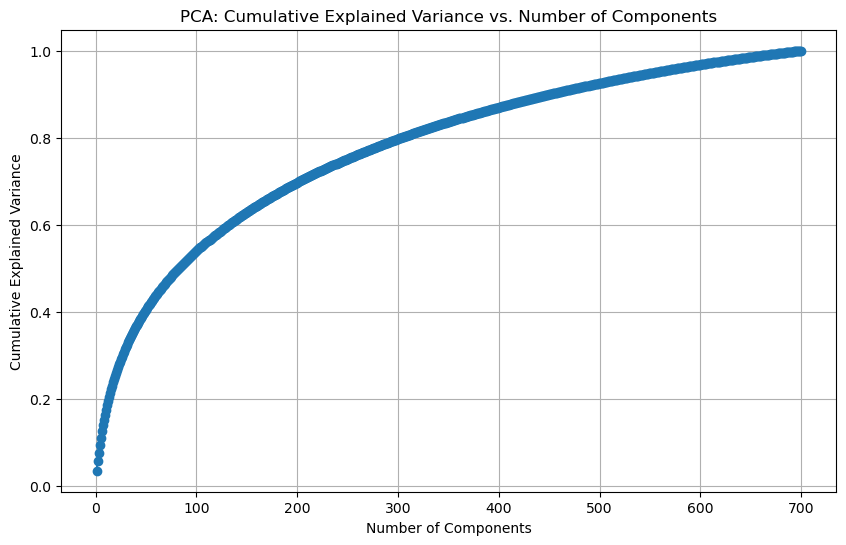

Number of components to explain 95.0% variance: 555


In [29]:
pca = PCA(n_components=700)  # Start with all components
pca.fit(all_embeddings)

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, 701), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA: Cumulative Explained Variance vs. Number of Components')
plt.grid()
plt.show()

# Determine the number of components that explain 95% variance
threshold = 0.95
num_components = np.argmax(cumulative_variance >= threshold) + 1
print(f'Number of components to explain {threshold*100}% variance: {num_components}')


#Number of components to explain 95.0% variance: 555

In [4]:
#from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality
pca = PCA(n_components=555)
reduced_embeddings = pca.fit_transform(all_embeddings)

# DBSCAN

In [5]:
#import numpy as np
#from sklearn.decomposition import PCA
#from sklearn.cluster import DBSCAN
#from sklearn.metrics.pairwise import cosine_similarity

def batch_dbscan(pca_embeddings, batch_size, eps=0.5, min_samples=5, similarity_threshold=0.6):
    num_batches = len(pca_embeddings) // batch_size + 1
    all_labels = []
    current_label = 0  # Start label counter

    for i in range(num_batches):
        print(f"Processing batch {i+1}/{num_batches}")
        start = i * batch_size
        end = min((i + 1) * batch_size, len(pca_embeddings))

        batch_embeddings = pca_embeddings[start:end] #get the embeddings
        
        # Calculate Pairwise Cosine Similarities
        cosine_sim_matrix = cosine_similarity(batch_embeddings)
        
        # Apply the similarity threshold
        mask = cosine_sim_matrix >= similarity_threshold
        distance_matrix = 1 - cosine_sim_matrix
        distance_matrix[~mask] = 1  # Set distances that do not meet the threshold to max distance (1)

        # Ensure there are no negative values in the distance matrix
        np.clip(distance_matrix, 0, None, out=distance_matrix)

        # Perform DBSCAN using the adjusted distance matrix
        db = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
        batch_labels = db.fit_predict(distance_matrix)
        
        # Adjust labels to be unique across batches
        unique_batch_labels = np.unique(batch_labels)
        for label in unique_batch_labels:
            if label != -1:
                batch_labels = [current_label if lbl == label else lbl for lbl in batch_labels]
                current_label += 1
        
        all_labels.extend(batch_labels)

    return np.array(all_labels)

batch_size = 10000  
eps = 0.5
min_samples = 10
similarity_threshold = 0.7  

initial_labels = batch_dbscan(reduced_embeddings, batch_size, eps, min_samples, similarity_threshold)

Processing batch 1/39
Processing batch 2/39
Processing batch 3/39
Processing batch 4/39
Processing batch 5/39
Processing batch 6/39
Processing batch 7/39
Processing batch 8/39
Processing batch 9/39
Processing batch 10/39
Processing batch 11/39
Processing batch 12/39
Processing batch 13/39
Processing batch 14/39
Processing batch 15/39
Processing batch 16/39
Processing batch 17/39
Processing batch 18/39
Processing batch 19/39
Processing batch 20/39
Processing batch 21/39
Processing batch 22/39
Processing batch 23/39
Processing batch 24/39
Processing batch 25/39
Processing batch 26/39
Processing batch 27/39
Processing batch 28/39
Processing batch 29/39
Processing batch 30/39
Processing batch 31/39
Processing batch 32/39
Processing batch 33/39
Processing batch 34/39
Processing batch 35/39
Processing batch 36/39
Processing batch 37/39
Processing batch 38/39
Processing batch 39/39


In [6]:
#from collections import defaultdict

# Group sentences by their cluster labels
clusters = defaultdict(list)
for label, sentence in zip(initial_labels, all_sentences):
    clusters[label].append(sentence)

# Remove noise points (label -1)
clusters = {label: sentences for label, sentences in clusters.items() if label != -1}

# Print the number of clusters and the size of each cluster
print(f"Total number of clusters (excluding noise): {len(clusters)}")

for cluster_id, sentences in clusters.items():
    print(f"\nCluster {cluster_id} (Size: {len(sentences)}):")
    for sentence in sentences[:20]:  # Print the first 20 sentences in each cluster
        print(sentence)
    print("-" * 80)
    
# initially dbscan produces around 200 overlapping clusters
# custom merging function is developed to handle this 

Total number of clusters (excluding noise): 208

Cluster 0 (Size: 29):
continued home asa plavix statin nitrate metoprolol inhouse
started plavix atorvastatin acei metoprolol
continued home aspirin plavix rosuvastatin metoprolol
continued home aspirin atorvastatin hospitalized
patient continued home aspirin brilinta atorvastatin
metoprolol asa isosorbide simvastatin clopidogrel
continued aspirin ranolazine metoprolol
continued home statin metop asa ranolazine
continued asa statin bb
treated asa plavix atorvastatin metoprolol
medication regimen included mexiletine metoprolol bid home aspirin statin
continued home aspirin statin beta blocker
patient otherwise continued home aspirin statin carvedilol lisinopril spironolactone
continued aspirin daily beta blocker statin
continued medical management aspirin simvastatin metoprolol lisinopril furosemide
additionally continued home aspirin atorvastatin carvedilol
continued home metoprolol atorvastatin clopidogrel
continued aspirin atorvastatin

In [6]:
# to get the count of labels in each cluster
unique_labels, counts = np.unique(initial_labels, return_counts=True)
print("Unique labels and their counts:")
for label, count in zip(unique_labels, counts):
    print(f"Label {label}: {count} instances")

Unique labels and their counts:
Label -1: 376650 instances
Label 0: 28 instances
Label 1: 29 instances
Label 2: 26 instances
Label 3: 19 instances
Label 4: 11 instances
Label 5: 11 instances
Label 6: 10 instances
Label 7: 16 instances
Label 8: 30 instances
Label 9: 27 instances
Label 10: 25 instances
Label 11: 11 instances
Label 12: 11 instances
Label 13: 10 instances
Label 14: 23 instances
Label 15: 12 instances
Label 16: 24 instances
Label 17: 32 instances
Label 18: 9 instances
Label 19: 10 instances
Label 20: 33 instances
Label 21: 28 instances
Label 22: 36 instances
Label 23: 27 instances
Label 24: 38 instances
Label 25: 13 instances
Label 26: 10 instances
Label 27: 19 instances
Label 28: 10 instances
Label 29: 24 instances
Label 30: 30 instances
Label 31: 56 instances
Label 32: 31 instances
Label 33: 20 instances
Label 34: 18 instances
Label 35: 22 instances
Label 36: 10 instances
Label 37: 32 instances
Label 38: 11 instances
Label 39: 14 instances
Label 40: 10 instances
Label 41:

In [13]:
#  The function identifies clusters that are related based on average cosine similarity above a certain threshold.
# The results are stored in a dictionary where each cluster is mapped to its related clusters and their similarity scores.
# Using this, the treshold for custom merging function was decided.




# from sklearn.metrics.pairwise import cosine_similarity
# import numpy as np

# def debug_related_clusters(initial_labels, all_embeddings, similarity_threshold=0.7):
#     unique_labels = [label for label in np.unique(initial_labels) if label != -1]  # Exclude noise points (-1)
#     related_clusters = {}

#     for label_i in unique_labels:
#         cluster_i_embeddings = [embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_i]
#         related_clusters[label_i] = []

#         for label_j in unique_labels:
#             if label_j == label_i:  # Skip self-comparison
#                 continue

#             cluster_j_embeddings = [embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_j]

#             # Calculate average cosine similarity between clusters
#             similarity_matrix = cosine_similarity(cluster_i_embeddings, cluster_j_embeddings)
#             avg_similarity = similarity_matrix.mean()

#             print(f"Similarity between Cluster {label_i} and Cluster {label_j}: {avg_similarity:.7f}")

#             if avg_similarity >= similarity_threshold:
#                 related_clusters[label_i].append((label_j, avg_similarity))

#     return related_clusters

# # Example usage:
# similarity_threshold = 0.56
# related_clusters = debug_related_clusters(initial_labels, reduced_embeddings, similarity_threshold)

# for cluster_id, related in related_clusters.items():
#     if related:
#         related = sorted(related, key=lambda x: -x[1])  # Sort by similarity score, descending
#         related_str = ", ".join([f"({rel_id}, {sim_score:.7f})" for rel_id, sim_score in related])
#         print(f"Cluster {cluster_id} is related to: [{related_str}]")

Similarity between Cluster 0 and Cluster 1: 0.0953653
Similarity between Cluster 0 and Cluster 2: -0.0335703
Similarity between Cluster 0 and Cluster 3: 0.0961284
Similarity between Cluster 0 and Cluster 4: -0.0374777
Similarity between Cluster 0 and Cluster 5: 0.1129977
Similarity between Cluster 0 and Cluster 6: 0.1535579
Similarity between Cluster 0 and Cluster 7: 0.0306029
Similarity between Cluster 0 and Cluster 8: 0.1068112
Similarity between Cluster 0 and Cluster 9: -0.0060511
Similarity between Cluster 0 and Cluster 10: -0.0403378
Similarity between Cluster 0 and Cluster 11: 0.1707268
Similarity between Cluster 0 and Cluster 12: 0.0890410
Similarity between Cluster 0 and Cluster 13: 0.1263142
Similarity between Cluster 0 and Cluster 14: -0.0245109
Similarity between Cluster 0 and Cluster 15: 0.0534477
Similarity between Cluster 0 and Cluster 16: 0.5844191
Similarity between Cluster 0 and Cluster 17: 0.1068004
Similarity between Cluster 0 and Cluster 18: 0.0223837
Similarity bet

# Custom Merge Function

In [7]:
#from sklearn.metrics.pairwise import cosine_similarity
#import numpy as np

def merge_clusters(initial_labels, all_embeddings, similarity_threshold=0.7):
    unique_labels = list(np.unique(initial_labels))
    processed_labels = set()  # To keep track of processed clusters
    merged_labels = np.full_like(initial_labels, fill_value=-1)  # Initialize with -1 (unassigned)
    current_label = 1  # Start new labels from 1

    while unique_labels:
        label_i = unique_labels.pop(0)  # Take the first label from the list

        if label_i == -1 or label_i in processed_labels:  # Skip noise points and already processed clusters
            continue

        # Get embeddings for the current cluster
        cluster_i_embeddings = [embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_i]

        # Find clusters similar to the current cluster
        clusters_to_merge = [label_i]
        for label_j in unique_labels[:]:
            if label_j == -1 or label_j in processed_labels:
                continue

            # Get embeddings for the similar cluster
            cluster_j_embeddings = [embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_j]

            # Calculate average cosine similarity
            similarity_matrix = cosine_similarity(cluster_i_embeddings, cluster_j_embeddings)
            avg_similarity = similarity_matrix.mean()

            if avg_similarity >= similarity_threshold:
                clusters_to_merge.append(label_j)
                unique_labels.remove(label_j)  # Remove the label from the list as it will be merged

        # Step 2: Assign the same new label to all merged clusters
        for label in clusters_to_merge:
            merged_labels[initial_labels == label] = current_label
            processed_labels.add(label)  # Mark this label as processed

        current_label += 1  # Increment for the next merged cluster

    return merged_labels


similarity_threshold = 0.49 # This was the treshold found to be the best
merged_labels = merge_clusters(initial_labels, reduced_embeddings, similarity_threshold)

In [8]:
#from collections import defaultdict

# Group sentences by their new merged cluster labels
clusters = defaultdict(list)

all_sentences_combined = all_sentences  # all_sentences should be the complete list used with the embeddings

# Map the merged labels to their corresponding sentences
for label, sentence in zip(merged_labels, all_sentences_combined):
    clusters[label].append(sentence)

# Remove noise points (label -1) 
clusters = {label: sentences for label, sentences in clusters.items() if label != -1}

# Print the number of clusters and the size of each cluster
print(f"Total number of clusters (excluding noise): {len(clusters)}")

# Display clusters and sentences
for cluster_id, sentences in clusters.items():
    print(f"\nCluster {cluster_id} (Size: {len(sentences)}):")
    for sentence in sentences[:20]:  # Print the first 20 sentences in each cluster
        print(sentence)
    print("-" * 80)

Total number of clusters (excluding noise): 22

Cluster 1 (Size: 809):
continued home asa plavix statin nitrate metoprolol inhouse
started plavix atorvastatin acei metoprolol
continued home aspirin plavix rosuvastatin metoprolol
continued home aspirin atorvastatin hospitalized
patient continued home aspirin brilinta atorvastatin
metoprolol asa isosorbide simvastatin clopidogrel
continued home statin metop asa ranolazine
continued asa statin bb
treated asa plavix atorvastatin metoprolol
medication regimen included mexiletine metoprolol bid home aspirin statin
continued home aspirin statin beta blocker
patient otherwise continued home aspirin statin carvedilol lisinopril spironolactone
continued aspirin daily beta blocker statin
continued medical management aspirin simvastatin metoprolol lisinopril furosemide
additionally continued home aspirin atorvastatin carvedilol
continued home metoprolol atorvastatin clopidogrel
continued aspirin atorvastatin inpatient
continued plavix daily aspiri

# evaluation

In [9]:
#from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Evaluate clustering quality

db_index = davies_bouldin_score(reduced_embeddings, merged_labels)
ch_score = calinski_harabasz_score(reduced_embeddings, merged_labels)


print(f'Davies-Bouldin Index: {db_index:.4f}')
print(f'Calinski-Harabasz Index: {ch_score:.4f}')

Davies-Bouldin Index: 1.8422
Calinski-Harabasz Index: 145.3495


# LDA and WordCloud

In [10]:
# import nltk
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize
# from nltk.stem import WordNetLemmatizer
# import string



def preprocess_text(text):
    # Tokenization
    tokens = word_tokenize(text.lower())
    
    # Remove punctuation
    tokens = [word for word in tokens if word.isalnum()]
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    return tokens

In [11]:
# #from gensim import corpora
# #from gensim.models import LdaModel
# #import numpy as np

# def apply_topic_modeling_to_all_clusters(all_sentences, merged_labels, num_topics=3):
#     unique_labels = np.unique(merged_labels)
    
#     for label in unique_labels:
#         if label == -1:
#             # Skip noise points if any
#             continue
            
#         print(f"\nTopic Modeling for Cluster {label}:\n")
#         cluster_sentences = [sentence for lbl, sentence in zip(merged_labels, all_sentences) if lbl == label]
        
#         if not cluster_sentences:
#             print(f"Cluster {label} is empty, skipping...")
#             continue

#         # Preprocess the text (tokenization, stopwords removal, etc.)
#         processed_sentences = [preprocess_text(sentence) for sentence in cluster_sentences]
        
#         # Create a dictionary
#         dictionary = corpora.Dictionary(processed_sentences)
#         corpus = [dictionary.doc2bow(text) for text in processed_sentences]
        
#         # Apply LDA model
#         lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
        
#         # Print the topics for this cluster
#         topics = lda_model.print_topics(num_words=5)
#         for topic in topics:
#             print(topic)
#         print("\n" + "="*80 + "\n")


# apply_topic_modeling_to_all_clusters(all_sentences, merged_labels, num_topics=3)



# #prints the scores for each cluster. example - 

# # Topic Modeling for Cluster 1:

# # (0, '0.146*"continued" + 0.099*"aspirin" + 0.088*"atorvastatin" + 0.081*"home" + 0.065*"metoprolol"')
# # (1, '0.075*"lisinopril" + 0.056*"amlodipine" + 0.040*"continue" + 0.036*"losartan" + 0.033*"metoprolol"')
# # (2, '0.084*"continued" + 0.081*"aspirin" + 0.069*"metoprolol" + 0.059*"atorvastatin" + 0.046*"home"')



Topic Modeling for Cluster 1:

(0, '0.146*"continued" + 0.099*"aspirin" + 0.088*"atorvastatin" + 0.081*"home" + 0.065*"metoprolol"')
(1, '0.075*"lisinopril" + 0.056*"amlodipine" + 0.040*"continue" + 0.036*"losartan" + 0.033*"metoprolol"')
(2, '0.084*"continued" + 0.081*"aspirin" + 0.069*"metoprolol" + 0.059*"atorvastatin" + 0.046*"home"')



Topic Modeling for Cluster 2:

(0, '0.137*"lasix" + 0.099*"iv" + 0.088*"diuresed" + 0.065*"transitioned" + 0.059*"po"')
(1, '0.160*"lasix" + 0.117*"diuresed" + 0.117*"iv" + 0.049*"bolus" + 0.038*"gtt"')
(2, '0.088*"euvolemia" + 0.034*"dos" + 0.032*"diuresed" + 0.026*"day" + 0.023*"aggressively"')



Topic Modeling for Cluster 3:

(0, '0.198*"iron" + 0.088*"study" + 0.080*"anemia" + 0.079*"deficiency" + 0.048*"consistent"')
(1, '0.085*"iron" + 0.043*"given" + 0.037*"low" + 0.035*"ferritin" + 0.035*"deficiency"')
(2, '0.099*"iron" + 0.086*"low" + 0.076*"ferritin" + 0.055*"tibc" + 0.054*"study"')



Topic Modeling for Cluster 4:

(0, '0.086*"lantus" 

In [23]:
# # print top 5 topics
# def print_topics(lda_model, num_words=5):
#     topics = lda_model.print_topics(num_words=num_words)
#     for i, topic in enumerate(topics):
#         words = [word.split('*')[1].replace('"', '').strip() for word in topic[1].split(' + ')]
#         print(f"Topic {i+1}: {', '.join(words)}")


# for cluster_label, lda_model in lda_models.items():
#     print(f"Topic Modeling for Cluster {cluster_label}:")
#     print_topics(lda_model, num_words=5)
#     print("\n" + "="*80 + "\n")

Topic Modeling for Cluster 1:
Topic 1: atorvastatin, aspirin, metoprolol, started, lisinopril
Topic 2: home, continued, carvedilol, amlodipine, atorvastatin
Topic 3: continued, aspirin, home, metoprolol, plavix


Topic Modeling for Cluster 2:
Topic 1: lasix, diuresed, iv, good, home
Topic 2: lasix, gtt, bolus, drip, diuresed
Topic 3: lasix, iv, diuresed, transitioned, po


Topic Modeling for Cluster 3:
Topic 1: iron, anemia, study, low, ferritin
Topic 2: iron, deficiency, study, anemia, ferritin
Topic 3: iron, given, superimposed, sat, low


Topic Modeling for Cluster 4:
Topic 1: breakfast, dinner, lunch, lantus, discharged
Topic 2: humalog, lantus, meal, scale, sliding
Topic 3: scale, sliding, humalog, insulin, glargine


Topic Modeling for Cluster 5:
Topic 1: coli, e, pansensitive, grew, culture
Topic 2: urine, culture, grew, pansensitive, ecoli
Topic 3: grew, urine, culture, pansensitive, ultimately


Topic Modeling for Cluster 6:
Topic 1: pain, controlled, tylenol, oxycodone, neede

In [12]:
def apply_topic_modeling(all_sentences, merged_labels, num_topics=3):
    unique_labels = np.unique(merged_labels)
    lda_models = {}
    
    for label in unique_labels:
        if label == -1:
            # Skip noise points if any
            continue
            
        print(f"\nTopic Modeling for Cluster {label}:\n")
        
        # Get sentences for the current cluster
        cluster_sentences = [sentence for lbl, sentence in zip(merged_labels, all_sentences) if lbl == label]
        
        if not cluster_sentences:
            print(f"Cluster {label} is empty, skipping...")
            continue

        # Preprocess the text (tokenization, stopwords removal, etc.)
        processed_sentences = [preprocess_text(sentence) for sentence in cluster_sentences]
        
        # Create a dictionary and corpus
        dictionary = corpora.Dictionary(processed_sentences)
        corpus = [dictionary.doc2bow(text) for text in processed_sentences]
        
        # Apply LDA model
        lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
        
        # Store the lda_model in the dictionary for later use
        lda_models[label] = lda_model
        
        # Print the topics for this cluster
        topics = lda_model.print_topics(num_words=5)
        for topic in topics:
            print(topic)
        print("\n" + "="*80 + "\n")
    
    return lda_models


lda_models = apply_topic_modeling(all_sentences, merged_labels, num_topics=3)


Topic Modeling for Cluster 1:

(0, '0.098*"continued" + 0.087*"asa" + 0.071*"plavix" + 0.068*"atorvastatin" + 0.064*"statin"')
(1, '0.107*"aspirin" + 0.104*"continued" + 0.104*"atorvastatin" + 0.103*"metoprolol" + 0.061*"home"')
(2, '0.119*"continued" + 0.092*"home" + 0.081*"carvedilol" + 0.061*"aspirin" + 0.046*"lisinopril"')



Topic Modeling for Cluster 2:

(0, '0.152*"lasix" + 0.119*"diuresed" + 0.113*"iv" + 0.036*"bolus" + 0.033*"gtt"')
(1, '0.118*"lasix" + 0.105*"iv" + 0.068*"diuresed" + 0.044*"euvolemic" + 0.036*"bolus"')
(2, '0.136*"lasix" + 0.089*"iv" + 0.087*"diuresed" + 0.079*"transitioned" + 0.068*"po"')



Topic Modeling for Cluster 3:

(0, '0.120*"iron" + 0.075*"low" + 0.064*"anemia" + 0.062*"study" + 0.061*"ferritin"')
(1, '0.203*"iron" + 0.080*"study" + 0.076*"deficiency" + 0.055*"anemia" + 0.044*"consistent"')
(2, '0.046*"retic" + 0.040*"count" + 0.024*"ferritin" + 0.023*"transferrin" + 0.022*"indicating"')



Topic Modeling for Cluster 4:

(0, '0.068*"humalog" + 0.05

In [13]:
# print top 5 topics
def print_topics(lda_model, num_words=5):
    topics = lda_model.print_topics(num_words=num_words)
    for i, topic in enumerate(topics):
        words = [word.split('*')[1].replace('"', '').strip() for word in topic[1].split(' + ')]
        print(f"Topic {i+1}: {', '.join(words)}")


for cluster_label, lda_model in lda_models.items():
    print(f"Topic Modeling for Cluster {cluster_label}:")
    print_topics(lda_model, num_words=5)
    print("\n" + "="*80 + "\n")

Topic Modeling for Cluster 1:
Topic 1: continued, asa, plavix, atorvastatin, statin
Topic 2: aspirin, continued, atorvastatin, metoprolol, home
Topic 3: continued, home, carvedilol, aspirin, lisinopril


Topic Modeling for Cluster 2:
Topic 1: lasix, diuresed, iv, bolus, gtt
Topic 2: lasix, iv, diuresed, euvolemic, bolus
Topic 3: lasix, iv, diuresed, transitioned, po


Topic Modeling for Cluster 3:
Topic 1: iron, low, anemia, study, ferritin
Topic 2: iron, study, deficiency, anemia, consistent
Topic 3: retic, count, ferritin, transferrin, indicating


Topic Modeling for Cluster 4:
Topic 1: humalog, lantus, scale, sliding, regimen
Topic 2: scale, sliding, lantus, humalog, home
Topic 3: humalog, insulin, lantus, scale, sliding


Topic Modeling for Cluster 5:
Topic 1: urine, culture, grew, pansensitive, ecoli
Topic 2: ciprofloxacin, grew, culture, urine, pansensitive
Topic 3: culture, urine, grew, proteus, e


Topic Modeling for Cluster 6:
Topic 1: pain, tylenol, controlled, oxycodone, tra

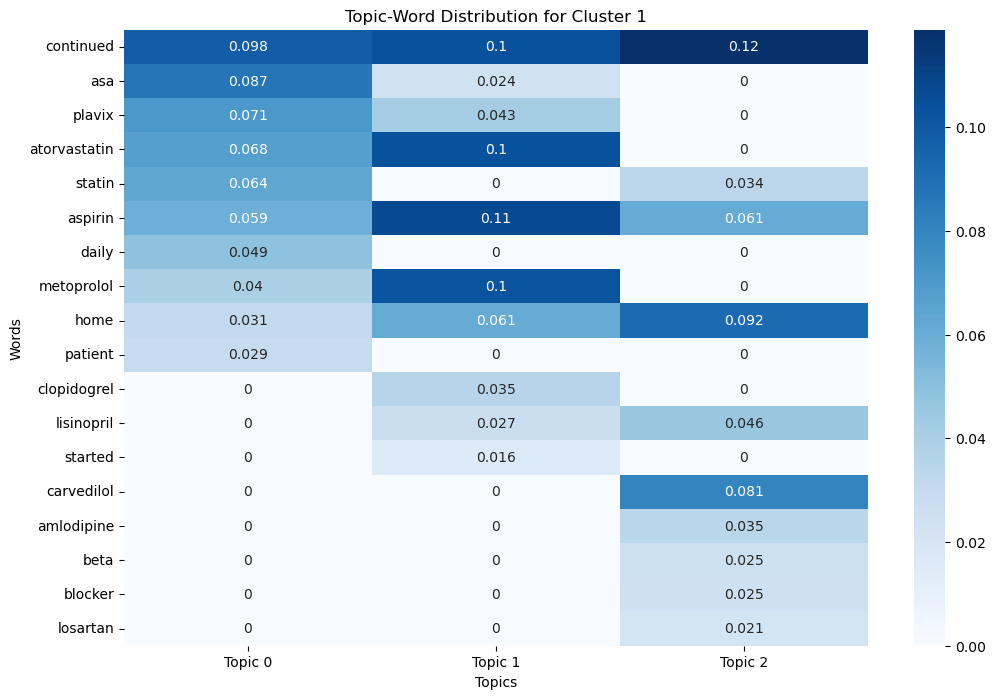

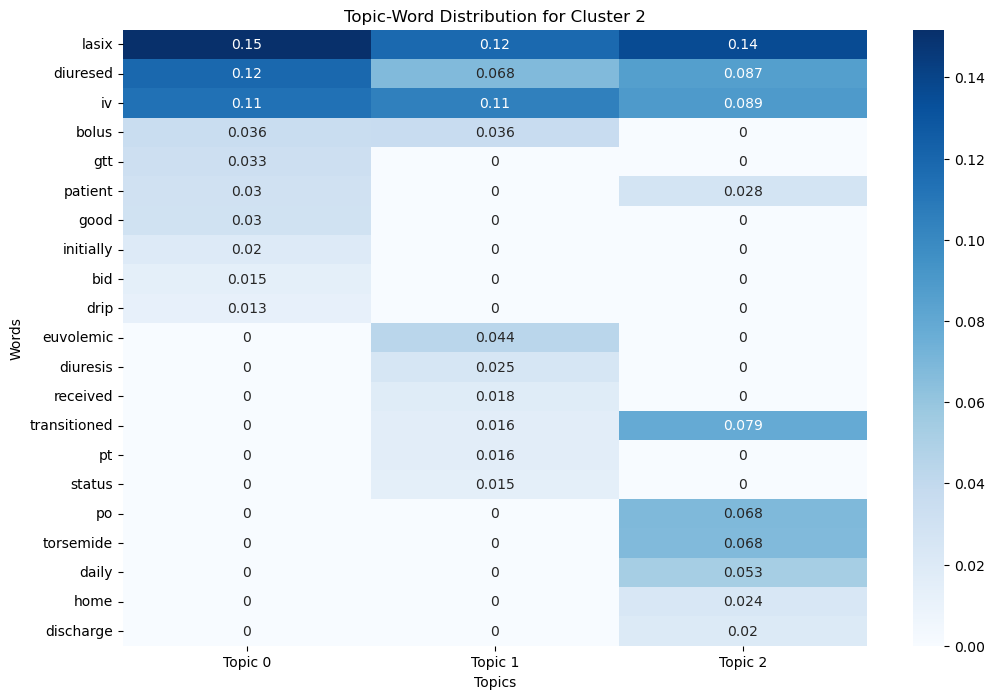

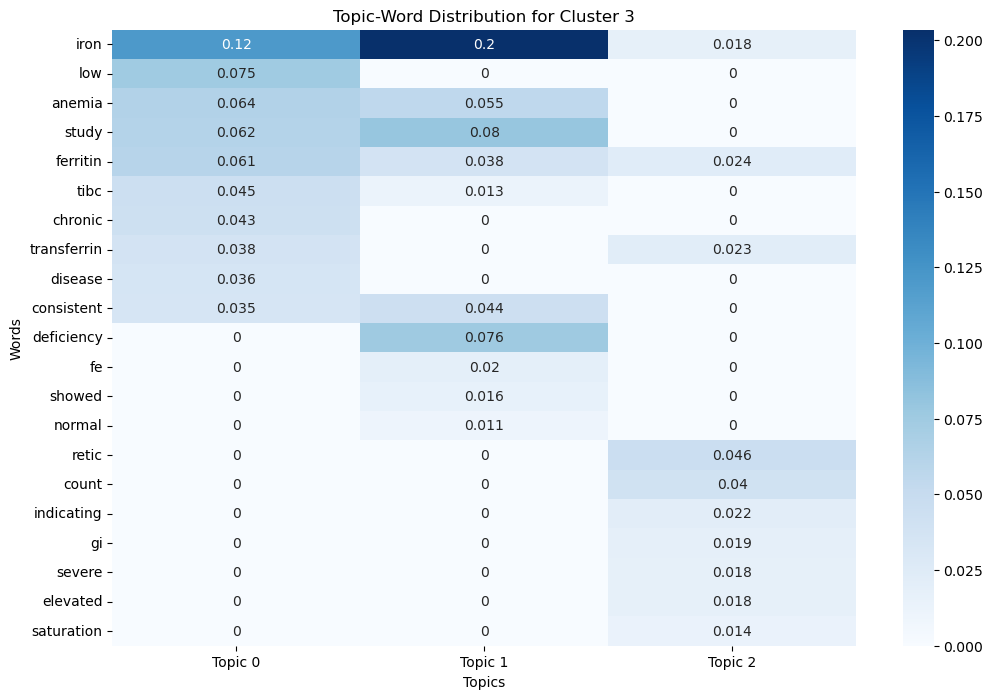

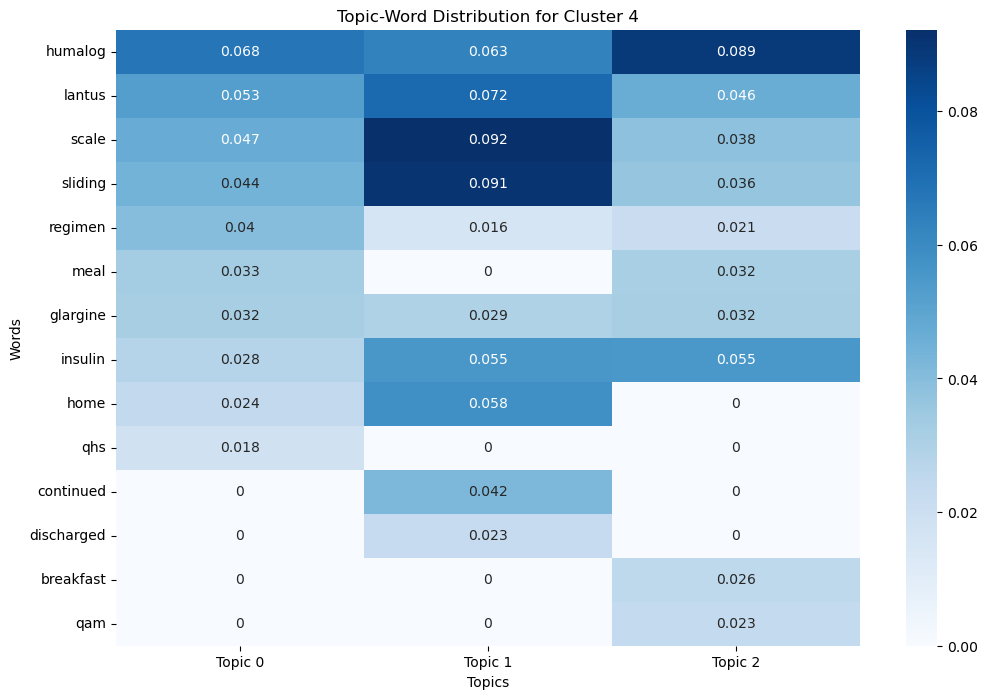

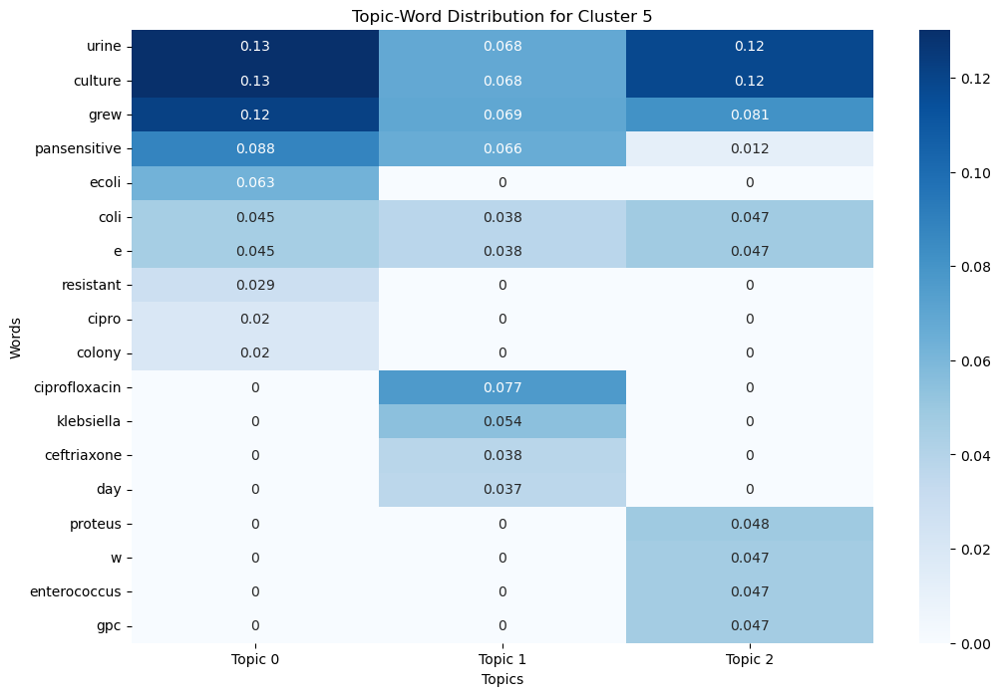

...

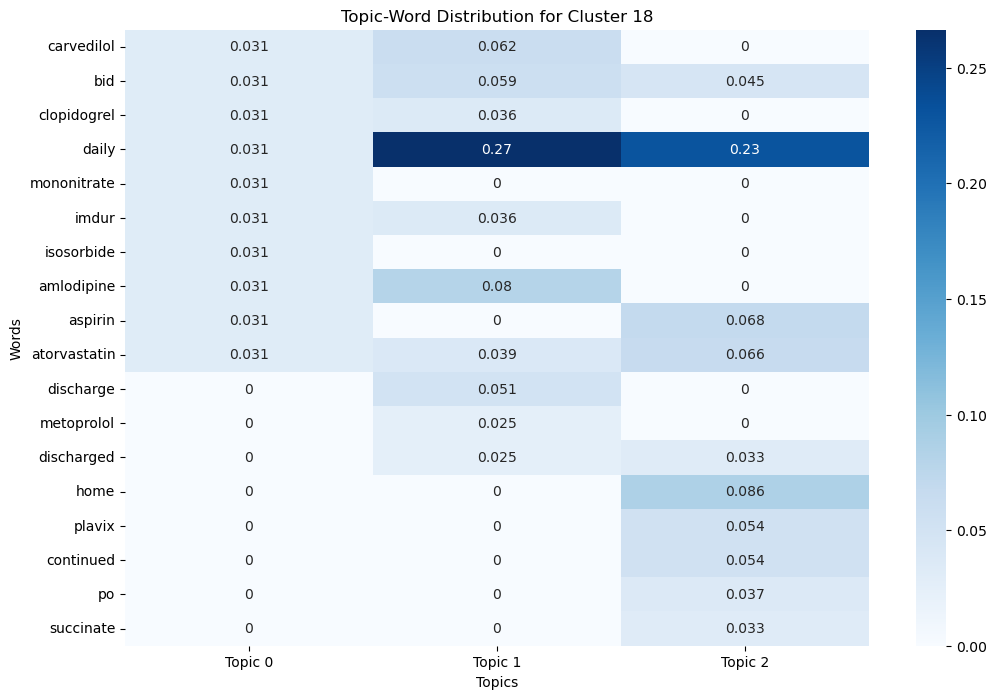

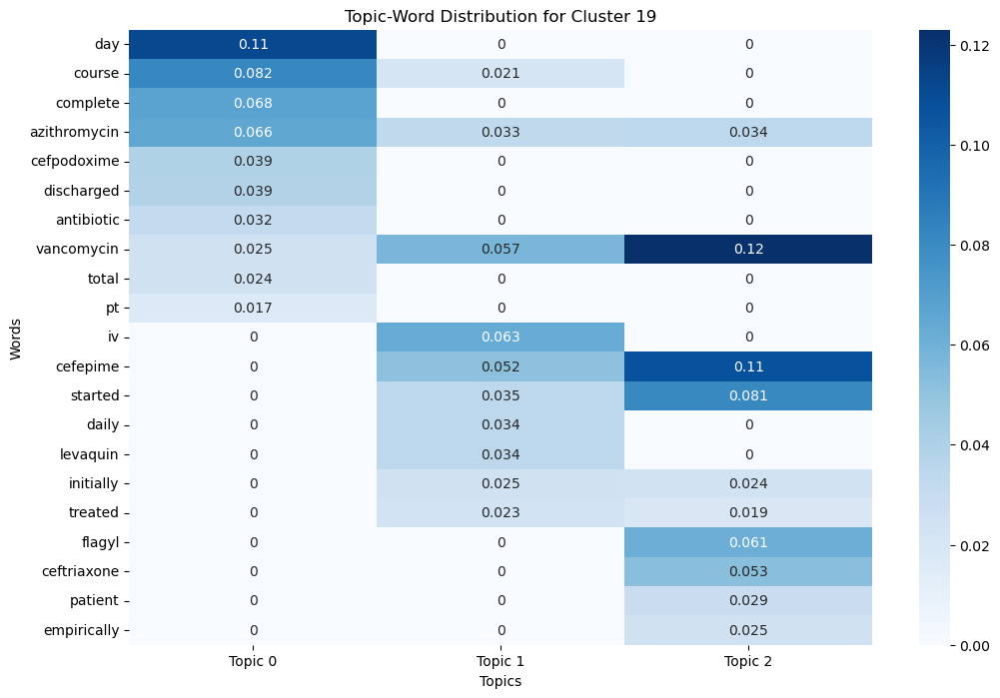

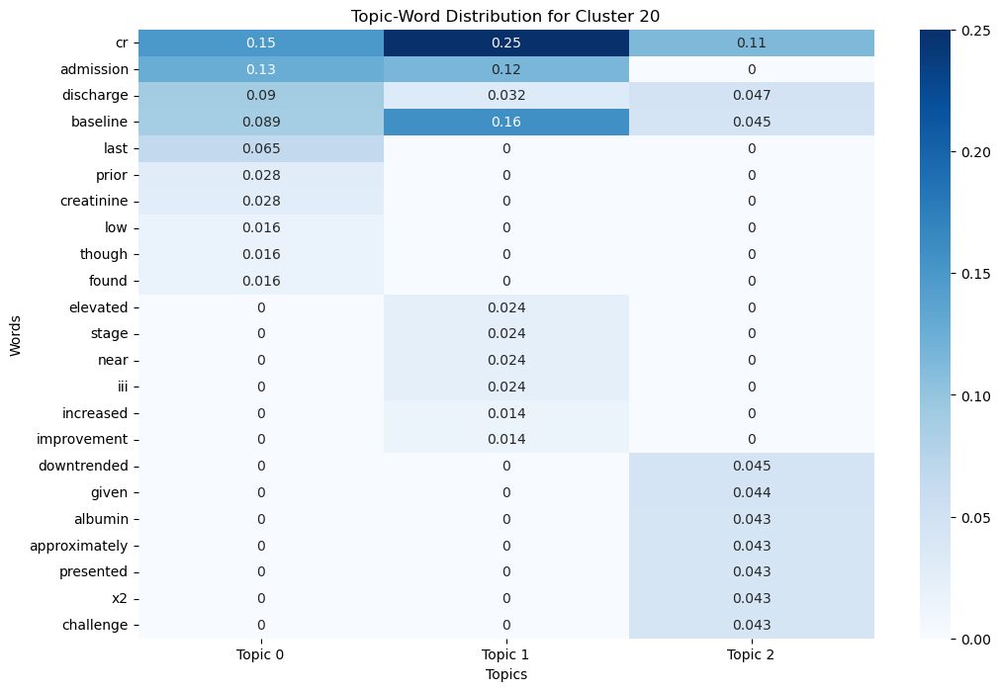

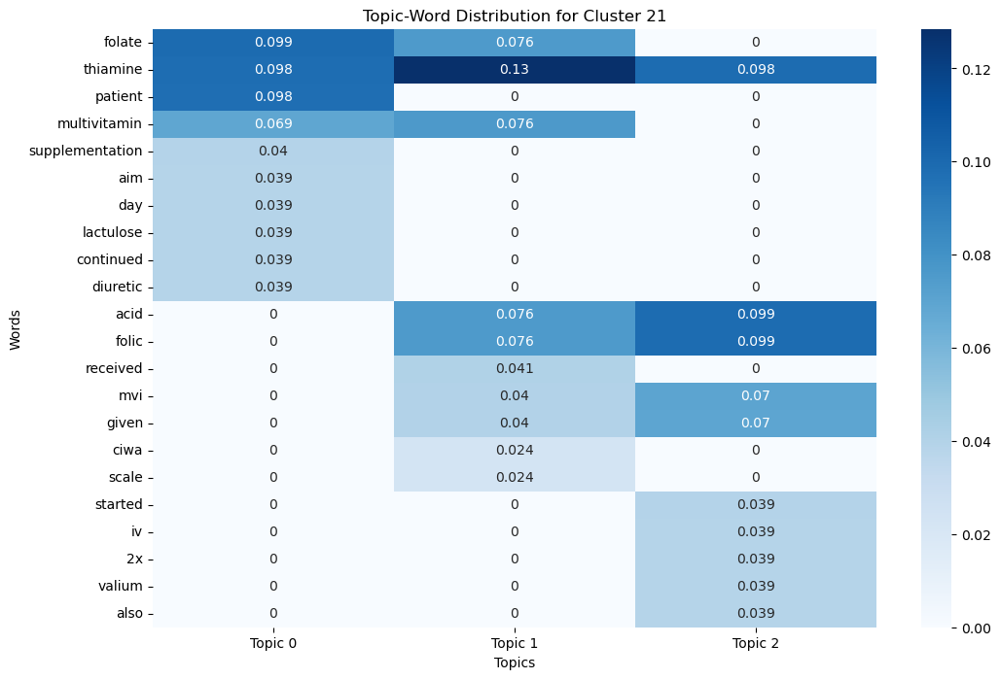

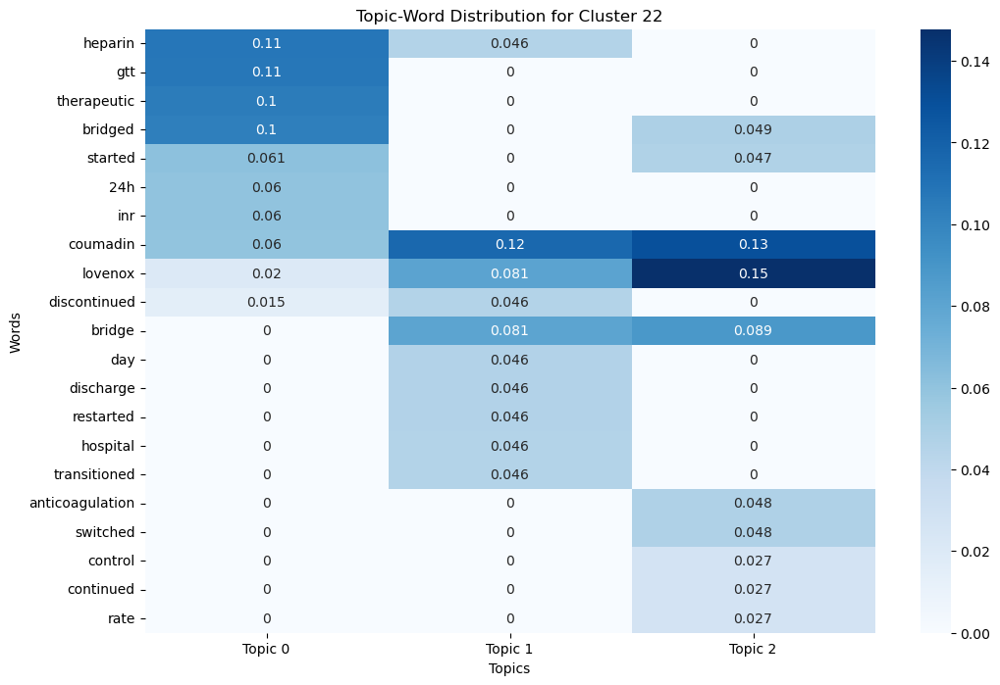

In [18]:
import seaborn as sns
import pandas as pd

def plot_heatmap(lda_model, num_topics, cluster_label):
    # Create a DataFrame to hold the topic-word weights
    topic_word_data = []
    for i in range(num_topics):
        topic_words = lda_model.show_topic(i, 10)  # Top 10 words
        words, weights = zip(*topic_words)
        topic_word_data.append(pd.Series(weights, index=words, name=f'Topic {i}'))

    # Combine the data into a DataFrame
    df = pd.DataFrame(topic_word_data).T.fillna(0)
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(df, annot=True, cmap='Blues')
    plt.title(f'Topic-Word Distribution for Cluster {cluster_label}')
    plt.ylabel('Words')
    plt.xlabel('Topics')
    plt.show()


for cluster_label, lda_model in lda_models.items():
    plot_heatmap(lda_model, num_topics=3, cluster_label=cluster_label)

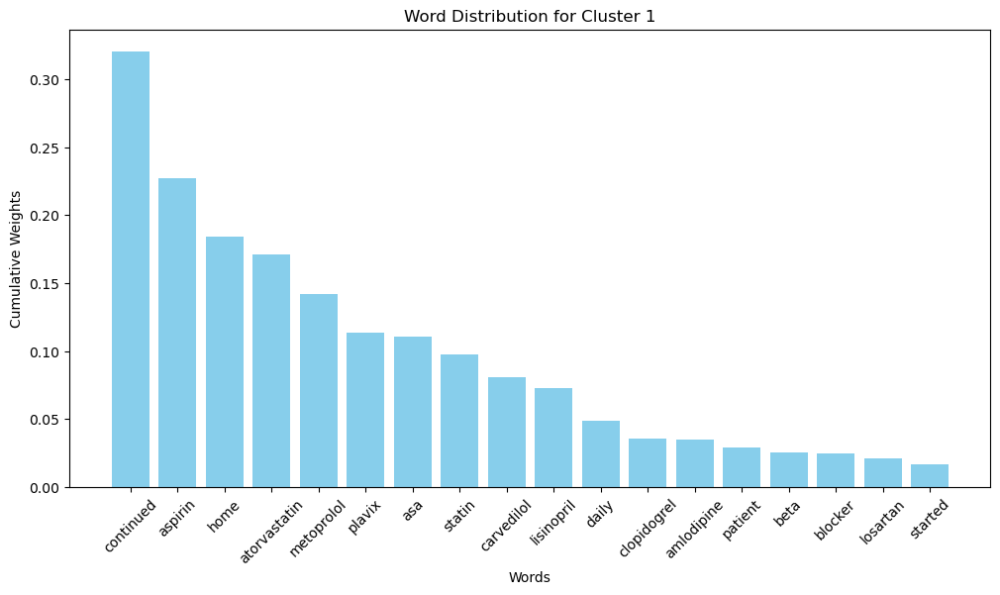

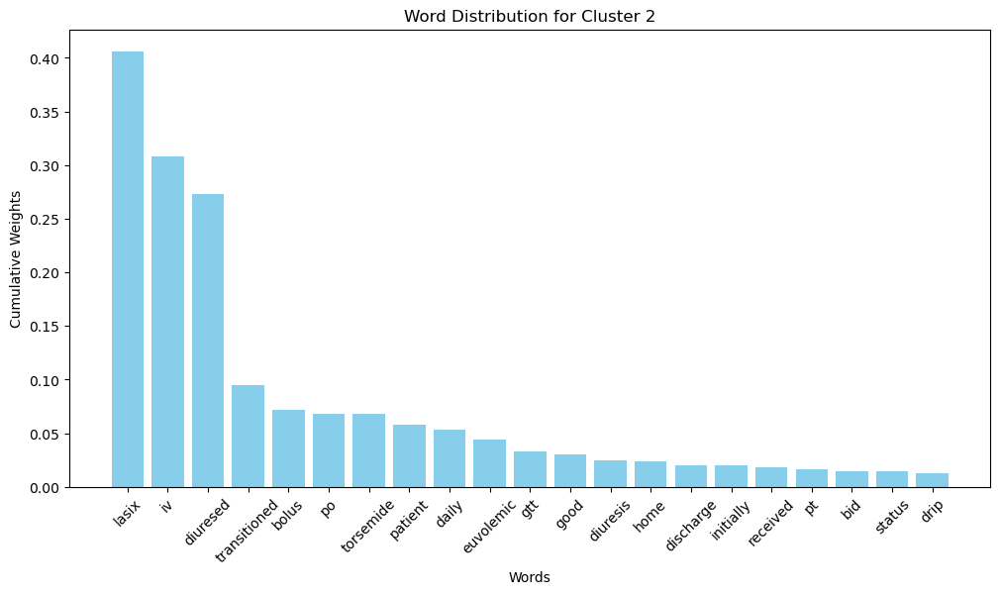

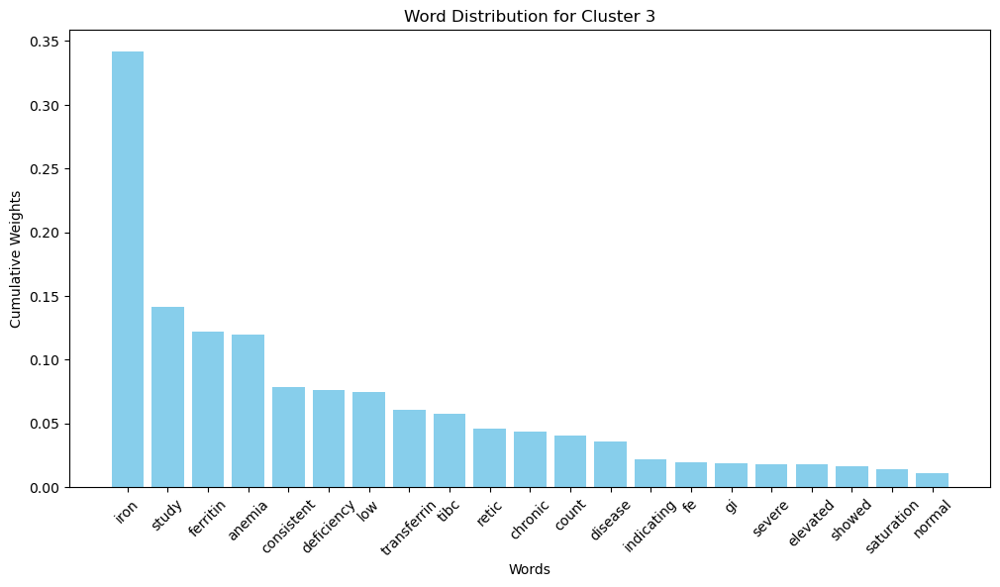

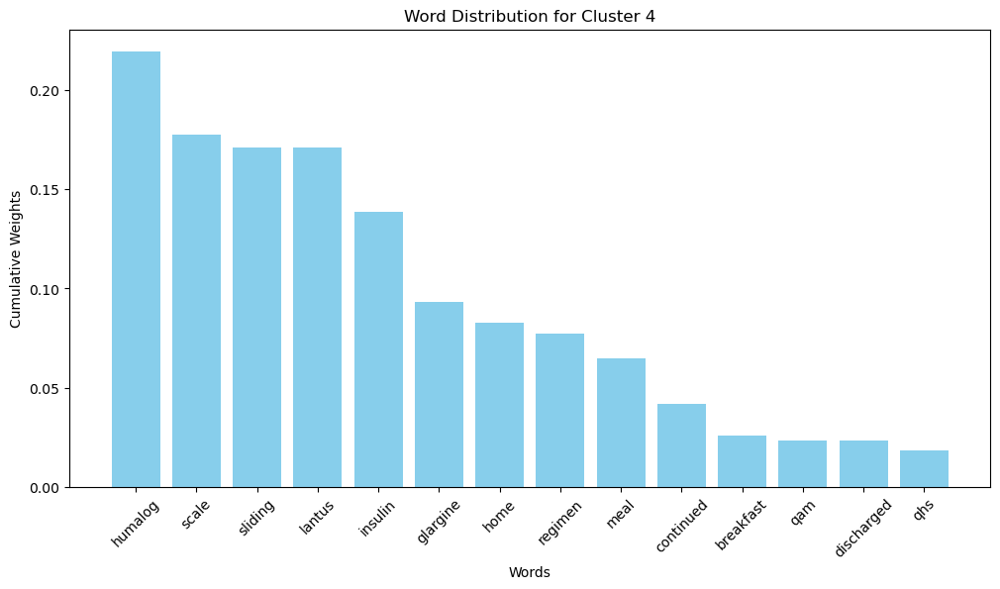

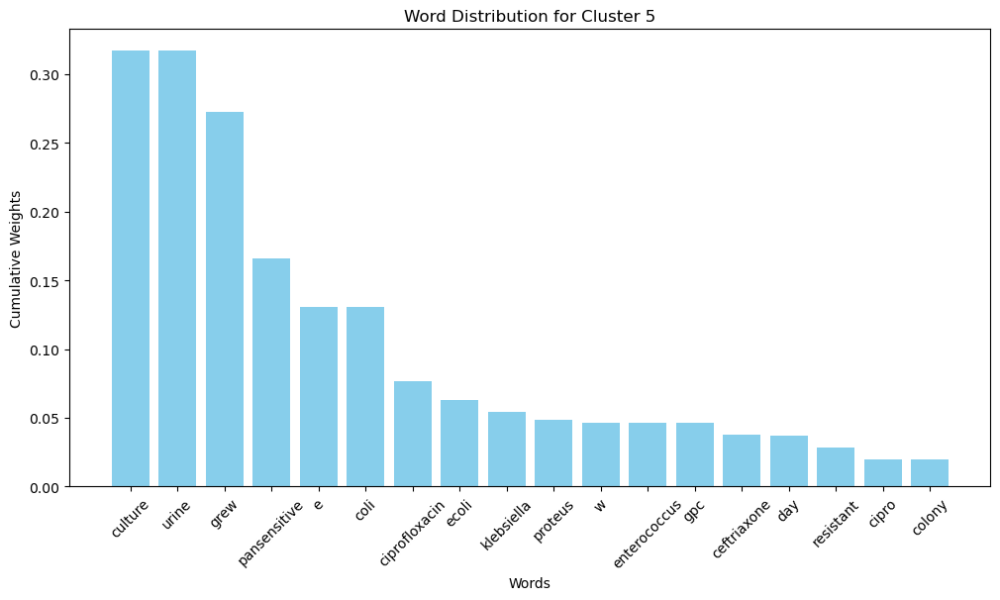

...

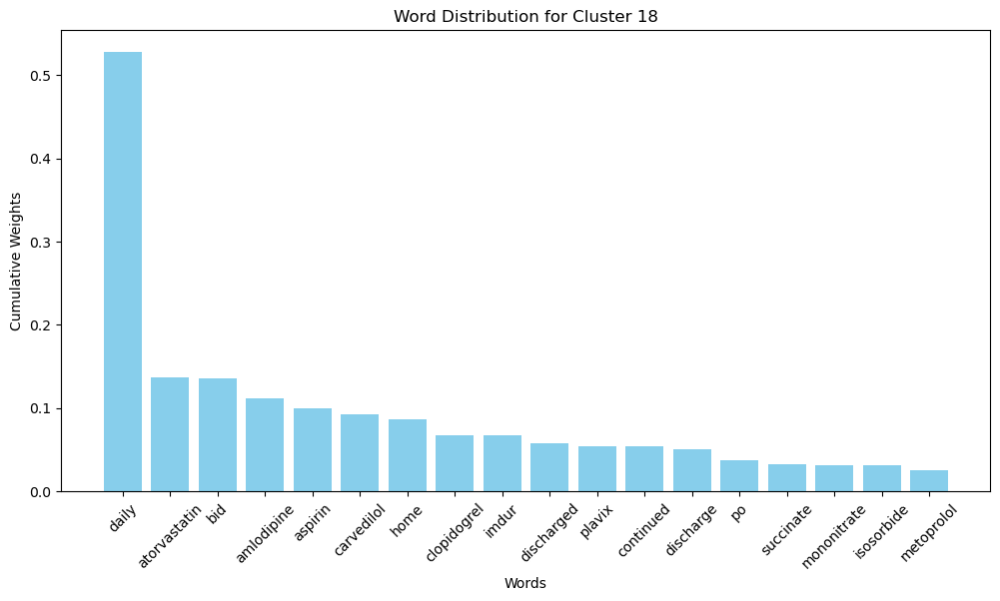

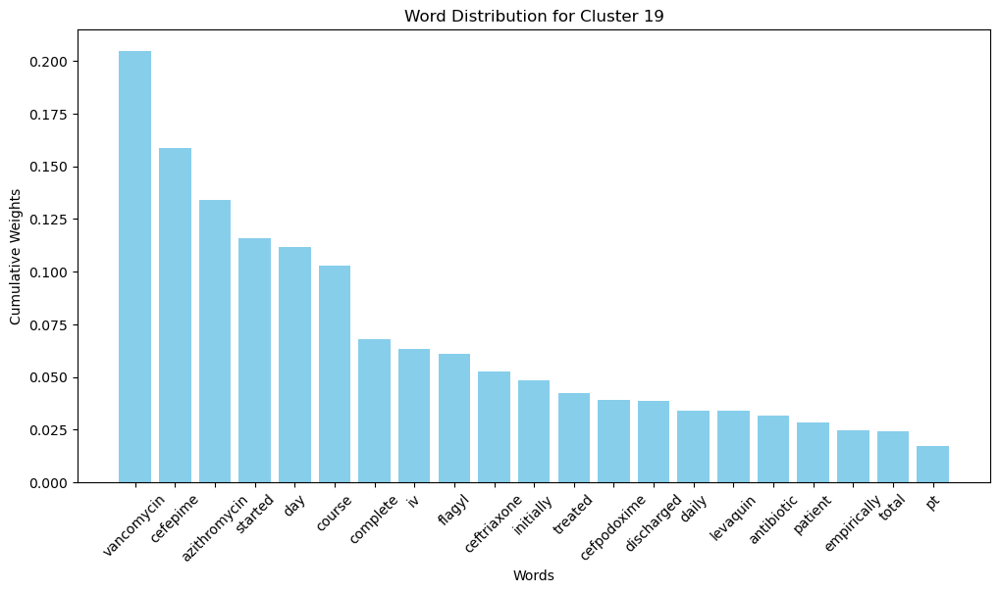

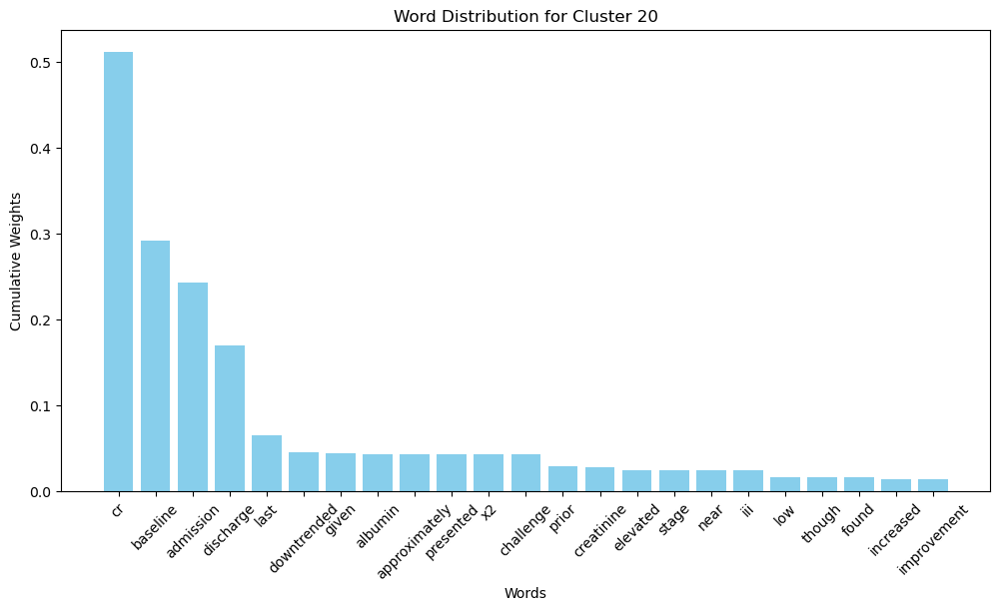

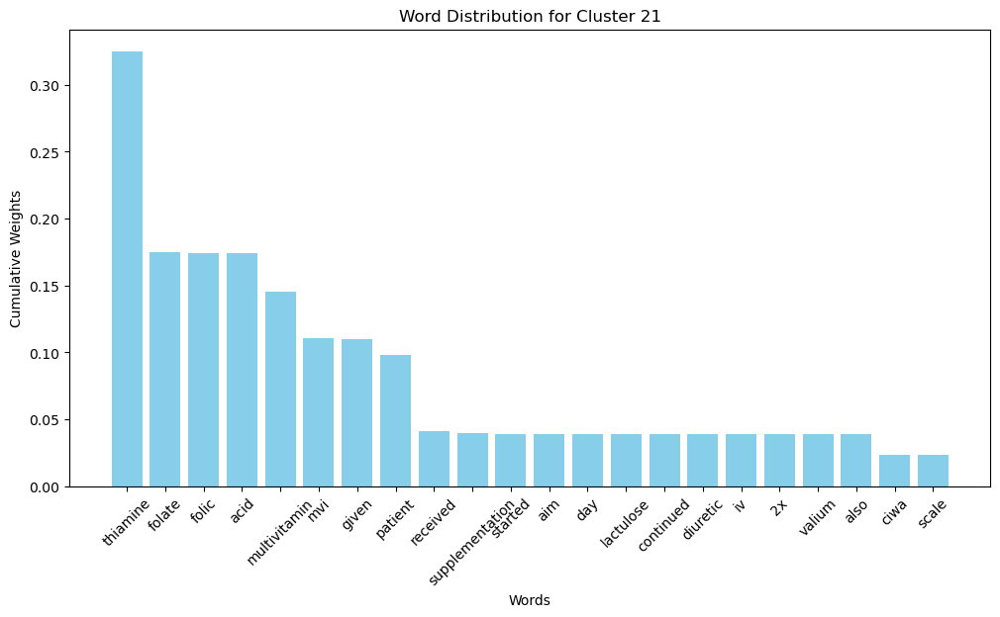

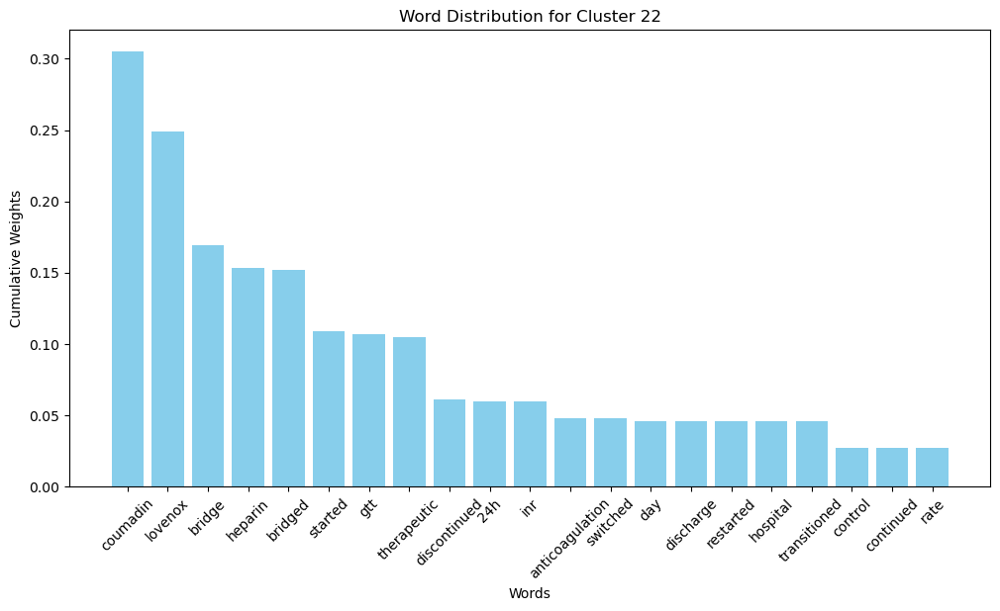

In [19]:
import matplotlib.pyplot as plt
from collections import defaultdict

def cluster_words_distribution(lda_model, num_topics, cluster_label):
    # Dictionary to store cumulative word weights across all topics
    word_weights = defaultdict(float)
    
    # Sum the weights of each word across all topics
    for i in range(num_topics):
        topic_words = lda_model.show_topic(i, 10)  # Top 10 words for each topic
        for word, weight in topic_words:
            word_weights[word] += weight
    
    # Sort the words by their cumulative weight
    sorted_word_weights = sorted(word_weights.items(), key=lambda x: x[1], reverse=True)
    words, weights = zip(*sorted_word_weights)
    
    # Create a bar chart for the entire cluster
    plt.figure(figsize=(12, 6))
    plt.bar(words, weights, color='skyblue')
    plt.xlabel('Words')
    plt.ylabel('Cumulative Weights')
    plt.title(f'Word Distribution for Cluster {cluster_label}')
    plt.xticks(rotation=45)
    plt.show()


for cluster_label, lda_model in lda_models.items():
    cluster_words_distribution(lda_model, num_topics=3, cluster_label=cluster_label)

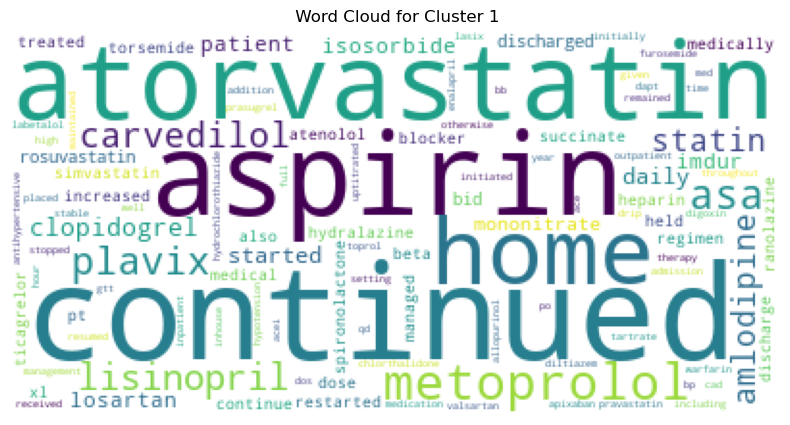

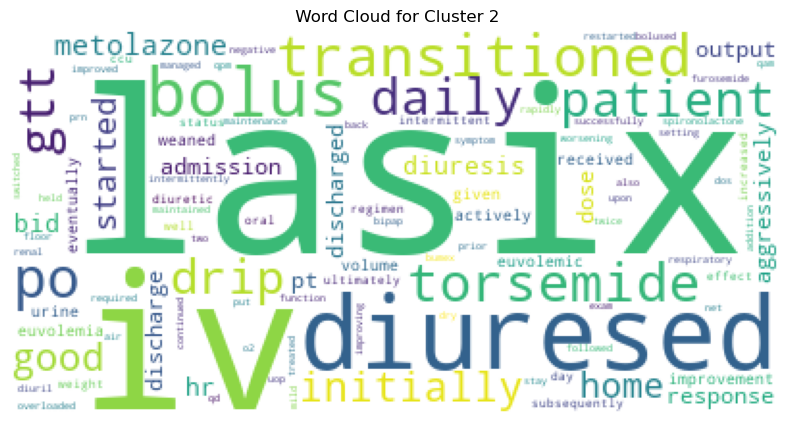

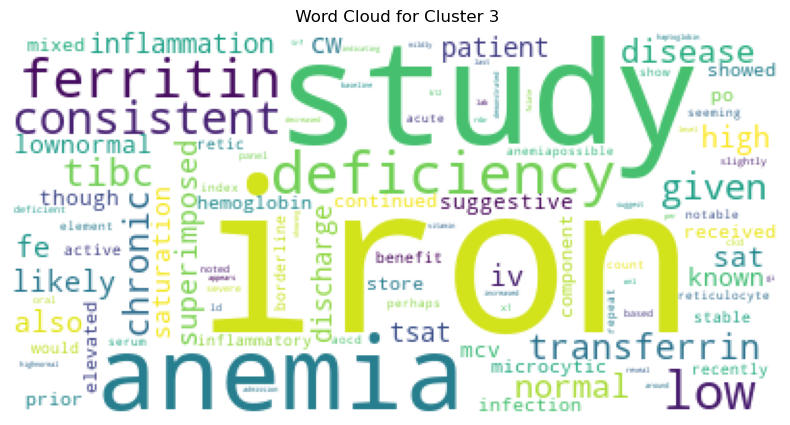

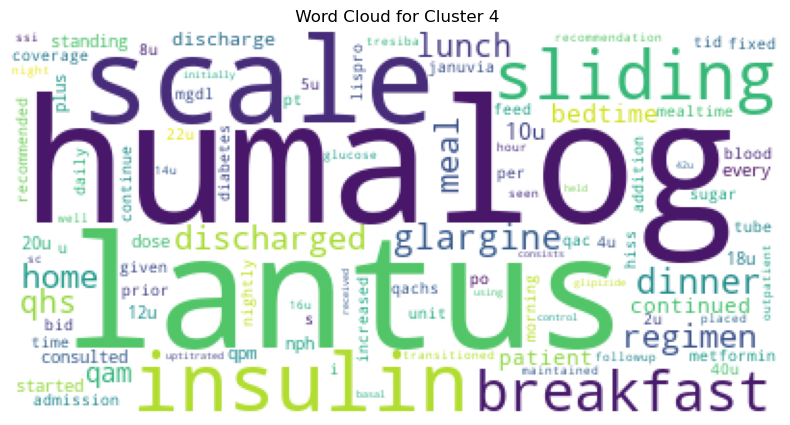

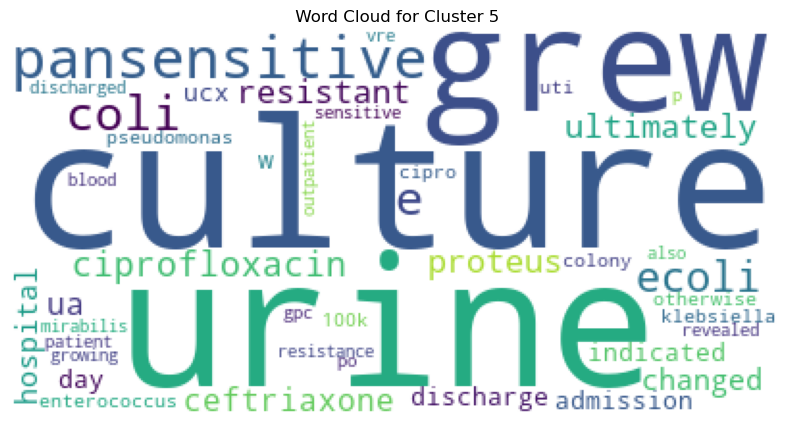

...

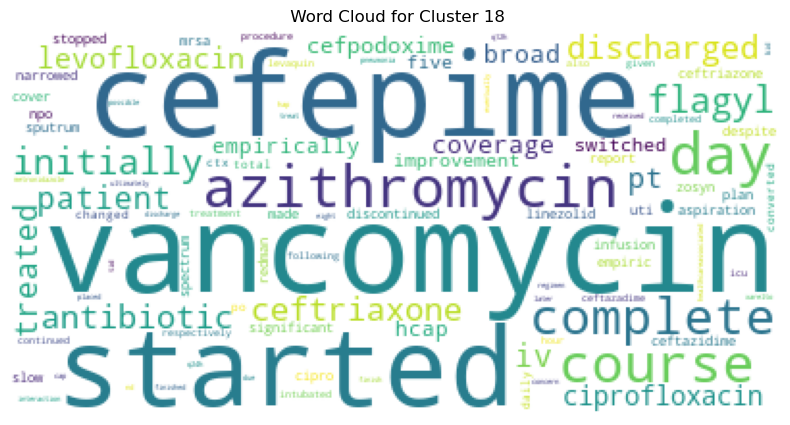

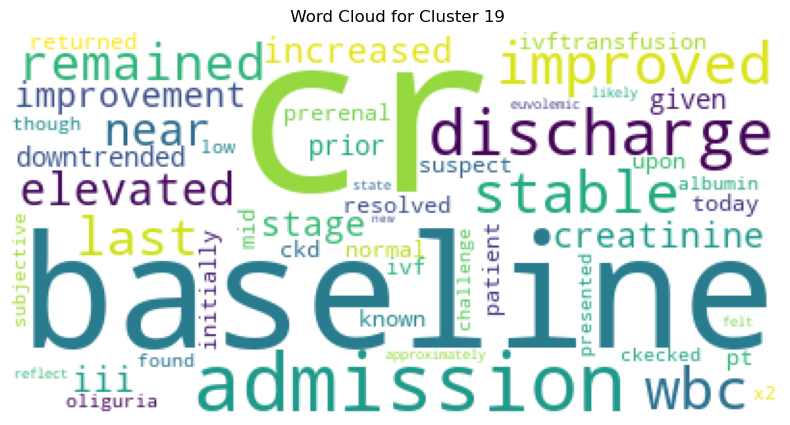

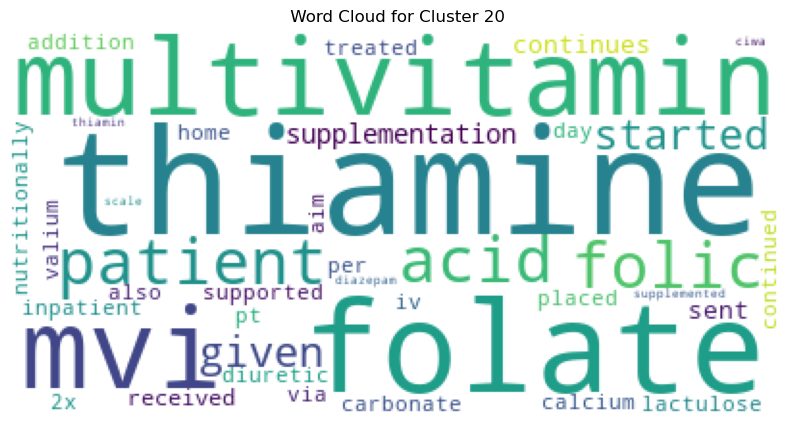

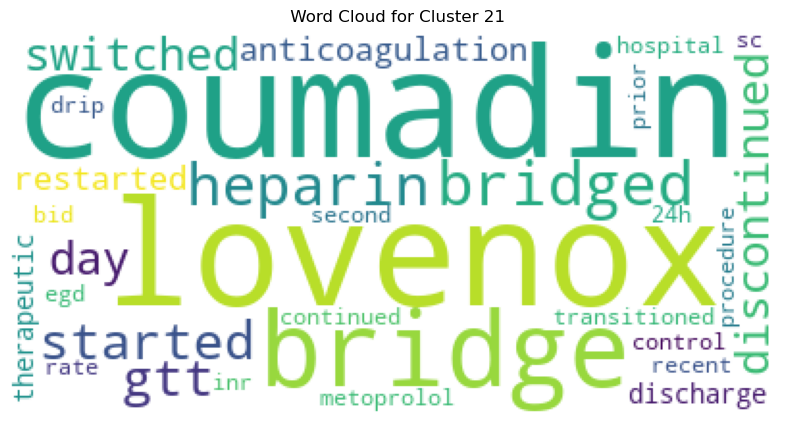

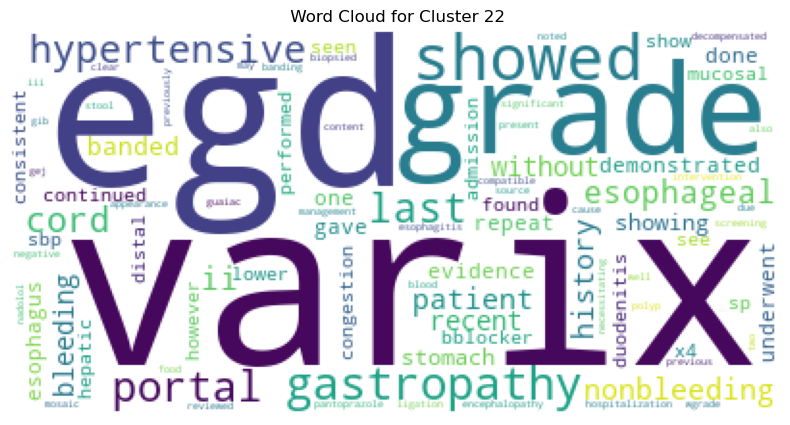

In [17]:
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt
# from collections import Counter

#Individual word clouds across all clusters

def cluster_wordclouds(lda_model, num_topics, cluster_label):
    # Aggregate words across all topics in the cluster
    combined_words = Counter()
    for i in range(num_topics):
        topic_words = lda_model.show_topic(i, 50)
        combined_words.update(dict(topic_words))
    
    # Generate and plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(WordCloud(background_color='white').fit_words(combined_words))
    plt.axis("off")
    plt.title(f' Word Cloud for Cluster {cluster_label}')
    plt.show()


for cluster_label, lda_model in lda_models.items():
    cluster_wordclouds(lda_model, num_topics=3, cluster_label=cluster_label)

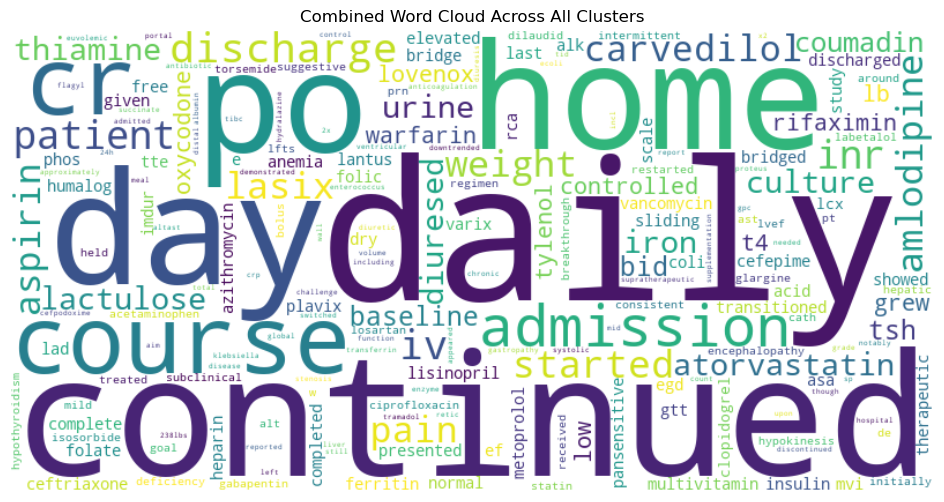

In [20]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict

def combined_wordcloud(lda_models, num_topics=2):
    combined_word_weights = defaultdict(float)

    # Iterate over each cluster and its LDA model
    for cluster_label, lda_model in lda_models.items():
        # Aggregate word weights from the top `num_topics` in each cluster
        for i in range(num_topics):
            topic_words = lda_model.show_topic(i, 10)  # Top 10 words for each topic
            for word, weight in topic_words:
                combined_word_weights[word] += weight
    
    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(combined_word_weights)
    
    # Plot the word cloud
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title('Combined Word Cloud Across All Clusters')
    plt.show()


combined_wordcloud(lda_models, num_topics=3)

# Density Plot

/var/folders/2p/71zs07692hv5z2c8hgsvnscw0000gn/T/ipykernel_54418/3492259797.py:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=cluster_points[:, 0], y=cluster_points[:, 1], cmap="Reds", shade=True, alpha=0.3)
/Users/saanidhya/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/saanidhya/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/var/folders/2p/71zs07692hv5z2c8hgsvnscw0000gn/T/ipykernel_54418/3492259797.py:22: FutureWarning: 

`shad

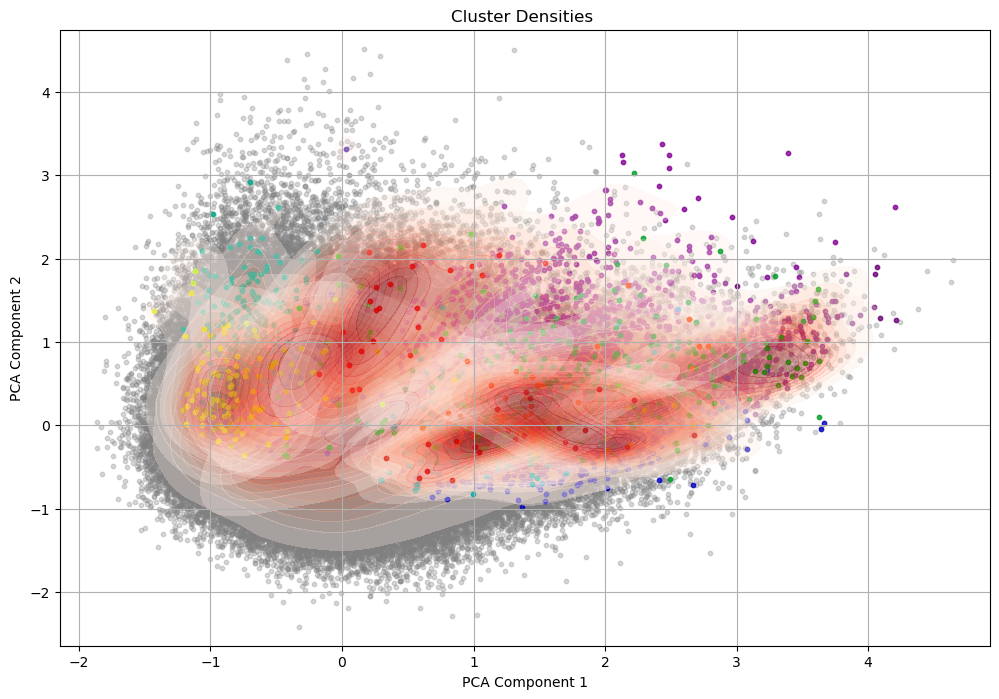

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_density(reduced_embeddings, labels, title="Cluster Densities Visualization"):
    unique_labels = np.unique(labels)
    
    plt.figure(figsize=(12, 8))
    for label in unique_labels:
        if label == -1:
            color = 'gray'
            alpha = 0.3
        else:
            color = plt.cm.nipy_spectral(float(label) / len(unique_labels))
            alpha = 0.8
        
        cluster_points = reduced_embeddings[labels == label]
        
        # Scatter plot for the cluster points
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], s=10, c=[color], alpha=alpha)
        
        # Density plot using seaborn
        sns.kdeplot(x=cluster_points[:, 0], y=cluster_points[:, 1], cmap="Reds", shade=True, alpha=0.3)

    plt.title(title)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.grid(True)
    plt.show()


visualize_density(reduced_embeddings, merged_labels, title="Cluster Densities ")

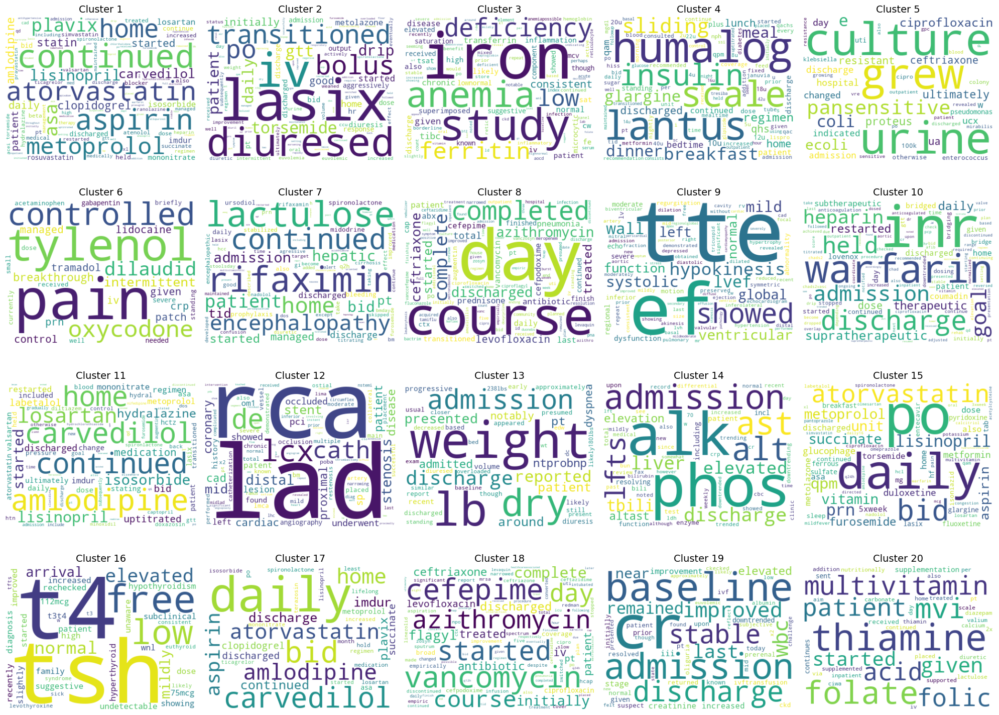

In [25]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


#wordclouds for all clusters

def word_clouds(lda_models, num_clusters, words_per_topic=50, grid_size=(4, 5)):
    """
    Plot a grid of word clouds for all clusters.

    :param lda_models: A dictionary where keys are cluster labels and values are LDA models.
    :param num_clusters: Number of clusters to show.
    :param words_per_topic: Number of words to display in each word cloud.
    :param grid_size: Tuple for the grid size (rows, columns).
    """
    fig, axes = plt.subplots(nrows=grid_size[0], ncols=grid_size[1], figsize=(20, 15))
    axes = axes.flatten()  # Flatten into a 1D array for easier indexing
    
    # Ensure num_clusters does not exceed the available grid size
    num_clusters = min(num_clusters, grid_size[0] * grid_size[1])
    
    # Loop through each cluster and plot its word cloud
    for i, (cluster_label, lda_model) in enumerate(lda_models.items()):
        if i >= num_clusters:  # Stop once the grid is full
            break
            
        # Generate a word cloud from the top words in all topics for the current cluster
        all_topics_words = {}
        for topic_id in range(lda_model.num_topics):
            topic_words = lda_model.show_topic(topic_id, words_per_topic)
            for word, weight in topic_words:
                if word in all_topics_words:
                    all_topics_words[word] += weight
                else:
                    all_topics_words[word] = weight
        
        # Plot the word cloud for the cluster
        wordcloud = WordCloud(width=400, height=300, background_color='white').generate_from_frequencies(all_topics_words)
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis('off')  # Hide the axes
        axes[i].set_title(f"Cluster {cluster_label}", fontsize=14)
    
    # Remove empty subplots if the number of clusters is less than grid size
    for ax in axes[i+1:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()


word_clouds(lda_models, num_clusters=20, grid_size=(4, 5))

# Other Models

HDBSCAN

In [ ]:
# import numpy as np
# import hdbscan
# from sklearn.metrics.pairwise import cosine_similarity

# def batch_hdbscan(embeddings, batch_size, min_cluster_size=10, min_samples=5, similarity_threshold=0.6):
#     num_batches = len(embeddings) // batch_size + 1
#     all_labels = []

#     for i in range(num_batches):
#         print(f"Processing batch {i+1}/{num_batches}")
#         start = i * batch_size
#         end = min((i + 1) * batch_size, len(embeddings))

#         batch_embeddings = embeddings[start:end].astype(np.float64)  # Ensure data type is float64
        
#        
#         cosine_sim_matrix = cosine_similarity(batch_embeddings)
        

#         mask = cosine_sim_matrix >= similarity_threshold
#         distance_matrix = 1 - cosine_sim_matrix
#         distance_matrix[~mask] = 1  # Set distances that do not meet the threshold to max distance (1)

#         np.clip(distance_matrix, 0, None, out=distance_matrix)
#         clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, metric='precomputed')
#         batch_labels = clusterer.fit_predict(distance_matrix.astype(np.float64))  # Ensure data type is float64
        
       
#         if len(all_labels) > 0:
#             max_label = max([label for label in all_labels if label != -1]) + 1
#             batch_labels = [label + max_label if label != -1 else -1 for label in batch_labels]
        
#         all_labels.extend(batch_labels)

#     return np.array(all_labels)

# batch_size = 10000  
# min_cluster_size = 12
# min_samples = 10
# similarity_threshold = 0.7  # Cosine similarity threshold


# initial_labels = batch_hdbscan(reduced_embeddings, batch_size, min_cluster_size, min_samples, similarity_threshold)

In [ ]:
# HDBSCAN evaluation


# from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# # Evaluate clustering quality

# db_index = davies_bouldin_score(reduced_embeddings, merged_labels)
# ch_score = calinski_harabasz_score(reduced_embeddings, merged_labels)


# print(f'Davies-Bouldin Index: {db_index:.4f}')
# print(f'Calinski-Harabasz Index: {ch_score:.4f}')

# Davies-Bouldin Index: 27.3227
# Calinski-Harabasz Index: 7.9807



Spectral

In [ ]:
# import numpy as np
# from sklearn.metrics.pairwise import cosine_similarity
# from sklearn.cluster import SpectralClustering
# from tqdm import tqdm

# def spectral_clustering(pca_embeddings, batch_size, n_clusters, similarity_threshold=0.6):
#     num_batches = len(pca_embeddings) // batch_size + 1
#     all_labels = []
#     current_label = 0  # Start label counter

#     for i in range(num_batches):
#         print(f"Processing batch {i+1}/{num_batches}")
#         start = i * batch_size
#         end = min((i + 1) * batch_size, len(pca_embeddings))

#         batch_embeddings = pca_embeddings[start:end]
        
#         
#         cosine_sim_matrix = cosine_similarity(batch_embeddings)
#         mask = cosine_sim_matrix >= similarity_threshold
#         affinity_matrix = np.where(mask, cosine_sim_matrix, 0)
        
#         # Perform Spectral Clustering using the affinity matrix
#         sc = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', assign_labels='discretize')
#         batch_labels = sc.fit_predict(affinity_matrix)
    
#         unique_batch_labels = np.unique(batch_labels)
#         for label in unique_batch_labels:
#             if label != -1:
#                 batch_labels = [current_label if lbl == label else lbl for lbl in batch_labels]
#                 current_label += 1
        
#         all_labels.extend(batch_labels)

#     return np.array(all_labels)


# batch_size = 10000 
# n_clusters = 9  
# similarity_threshold = 0.7  

# initial_labels = spectral_clustering(reduced_embeddings, batch_size, n_clusters, similarity_threshold)

In [ ]:
# from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# # Evaluate clustering quality

# db_index = davies_bouldin_score(reduced_embeddings, initial_labels)
# ch_score = calinski_harabasz_score(reduced_embeddings, initial_labels)


# print(f'Davies-Bouldin Index: {db_index:.4f}')
# print(f'Calinski-Harabasz Index: {ch_score:.4f}')

# Davies-Bouldin Index: 59.7230
# Calinski-Harabasz Index: 2.5378

Agglomerative

In [ ]:
# from sklearn.cluster import AgglomerativeClustering
# from sklearn.metrics.pairwise import cosine_similarity
# import numpy as np

# def clustering_agglomerative(pca_embeddings, batch_size, similarity_threshold=0.7, n_clusters=25):
#     num_batches = len(pca_embeddings) // batch_size + 1
#     all_labels = []
#     current_label = 0  # Start label counter

#     for i in range(num_batches):
#         print(f"Processing batch {i+1}/{num_batches}")
#         start = i * batch_size
#         end = min((i + 1) * batch_size, len(pca_embeddings))

#         batch_embeddings = pca_embeddings[start:end]
        
#         cosine_sim_matrix = cosine_similarity(batch_embeddings)
        
#         # Apply the similarity threshold
#         mask = cosine_sim_matrix >= similarity_threshold
#         distance_matrix = 1 - cosine_sim_matrix
#         distance_matrix[~mask] = 1  # Set distances that do not meet the threshold to max distance (1)


#         np.clip(distance_matrix, 0, None, out=distance_matrix)

#         # Perform Agglomerative Clustering using the adjusted distance matrix
#         clustering = AgglomerativeClustering(affinity='precomputed', linkage='average', n_clusters=n_clusters)
#         batch_labels = clustering.fit_predict(distance_matrix)
#         unique_batch_labels = np.unique(batch_labels)
#         for label in unique_batch_labels:
#             if label != -1:
#                 batch_labels = [current_label if lbl == label else lbl for lbl in batch_labels]
#                 current_label += 1
        
#         all_labels.extend(batch_labels)

#     return np.array(all_labels)


# initial_labels = clustering_agglomerative(reduced_embeddings, batch_size=10000, similarity_threshold=0.7, n_clusters=25)

In [ ]:
# from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# # Evaluate clustering quality

# db_index = davies_bouldin_score(reduced_embeddings, initial_labels)
# ch_score = calinski_harabasz_score(reduced_embeddings, initial_labels)


# print(f'Davies-Bouldin Index: {db_index:.4f}')
# print(f'Calinski-Harabasz Index: {ch_score:.4f}')

# Davies-Bouldin Index: 5.2625
# Calinski-Harabasz Index: 1.7001

In [ ]:
# archive code

In [ ]:
# from collections import defaultdict

# # Group sentences by their merged cluster labels
# clusters = defaultdict(list)
# for label, sentence in zip(merged_labels, all_sentences):
#     clusters[label].append(sentence)

# # Remove noise points (label -1)
# clusters = {label: sentences for label, sentences in clusters.items() if label != -1}

# # Print the number of clusters and the size of each cluster
# print(f"Total number of clusters (excluding noise): {len(clusters)}")


# for cluster_id, sentences in clusters.items():
#     print(f"\nCluster {cluster_id} (Size: {len(sentences)}):")
#     for sentence in sentences[:20]:  # Print the first 20 sentences in each cluster
#         print(sentence)
#     print("-" * 80)

In [ ]:
# from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# def evaluate_clusters_without_noise(embeddings, labels):
#     # Filter out noise points (labels == -1)
#     mask = labels != -1
#     filtered_embeddings = embeddings[mask]
#     filtered_labels = labels[mask]
    
#     # Ensure there are at least two clusters to evaluate
#     if len(np.unique(filtered_labels)) > 1:
#         silhouette_avg = silhouette_score(filtered_embeddings, filtered_labels, metric='cosine')
#         davies_bouldin = davies_bouldin_score(filtered_embeddings, filtered_labels)
#         calinski_harabasz = calinski_harabasz_score(filtered_embeddings, filtered_labels)
        
#         print(f'Silhouette Score: {silhouette_avg}')
#         print(f'Davies-Bouldin Index: {davies_bouldin}')
#         print(f'Calinski-Harabasz Index: {calinski_harabasz}')
#     else:
#         print("Not enough clusters to evaluate (all points might be noise or there's only one cluster).")


# evaluate_clusters_without_noise(reduced_embeddings, initial_labels)

In [12]:
# from sklearn.metrics.pairwise import cosine_similarity

# # Step 1: Extract sentences from Cluster 39 and Cluster 196
# cluster_39_sentences = [sentence for label, sentence in zip(initial_labels, all_sentences) if label == 1]
# cluster_196_sentences = [sentence for label, sentence in zip(initial_labels, all_sentences) if label == 45]

# # Step 2: Print the sentences to manually inspect for similarities
# print("Cluster 1 Sentences:")
# for sentence in cluster_39_sentences:
#     print(sentence)

# print("\nCluster 8 Sentences:")
# for sentence in cluster_196_sentences:
#     print(sentence)

# # Step 3: Compare the similarity between the clusters
# # Calculate average cosine similarity between all pairs of sentences from the two clusters
# if cluster_39_sentences and cluster_196_sentences:
#     # Get embeddings for sentences in the two clusters
#     cluster_39_embeddings = [embedding for label, embedding in zip(initial_labels, reduced_embeddings) if label == 1]
#     cluster_196_embeddings = [embedding for label, embedding in zip(initial_labels, reduced_embeddings) if label == 45]

#     # Calculate cosine similarity between all pairs
#     similarity_matrix = cosine_similarity(cluster_39_embeddings, cluster_196_embeddings)
#     avg_similarity = similarity_matrix.mean()
    
#     print(f"\nAverage Cosine Similarity between Cluster 1 and Cluster 8: {avg_similarity}")
# else:
#     print("One or both clusters are empty.")

Cluster 1 Sentences:
initially diuresed iv lasix ultimately held given mild
diuresed iv lasix transitioned torsemide
diuresed intermittent lasix iv boluses net negative length stay
patient diuresed iv lasix good response improvement symptoms
diuresed iv lasix needed transitioned torsemide po bid previously discharged torsemide daily
patient diuresed iv lasix good symptom improvement
initially diuresed intermittent iv lasix boluses however subsequently worsening renal function
diuresed requiring lasix iv iv
given edematous appearance patient diuresed iv lasix eventually transitioned po lasix daily
patient diuresed gently iv lasix given concern prerenal etiology
probnp admission diuresed well iv lasix transitioned po torsemide daily
given mild elevation troponin elevated weight patient diuresed iv lasix transitioned home diuretic po torsemide
diuresed iv lasix boluses euvolemic
creatinine responded iv lasix transitioned home dose po lasix
diuresed iv lasix boluses euvolemic transitioned 

In [ ]:
# from sklearn.metrics.pairwise import cosine_similarity
# import numpy as np

# def merge_similar_clusters(initial_labels, all_embeddings, similarity_threshold=0.7):
#     unique_labels = list(set(initial_labels) - {-1})  # Exclude noise points (-1)
#     clusters_to_merge = []

#     # Step 1: Identify clusters to merge
#     for i, label_i in enumerate(unique_labels):
#         cluster_i_embeddings = np.array([embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_i])
        
#         for j, label_j in enumerate(unique_labels):
#             if j <= i:
#                 continue  # Avoid redundant checks and self-comparison
                
#             cluster_j_embeddings = np.array([embedding for label, embedding in zip(initial_labels, all_embeddings) if label == label_j])
            
#             if cluster_i_embeddings.size > 0 and cluster_j_embeddings.size > 0:
#                 similarity_matrix = cosine_similarity(cluster_i_embeddings, cluster_j_embeddings)
#                 avg_similarity = similarity_matrix.mean()

#                 if avg_similarity >= similarity_threshold:
#                     clusters_to_merge.append((label_i, label_j))
#                     print(f"Clusters {label_i} and {label_j} have average similarity: {avg_similarity}. Marked for merging.")

#     # Step 2: Merge the clusters
#     for label_i, label_j in clusters_to_merge:
#         for idx, label in enumerate(initial_labels):
#             if label == label_j:
#                 initial_labels[idx] = label_i  # Merge cluster_j into cluster_i

#     # Step 3: Reassign unique labels
#     label_mapping = {old_label: new_label for new_label, old_label in enumerate(set(initial_labels))}
#     merged_labels = np.array([label_mapping[label] for label in initial_labels])

#     return merged_labels


# similarity_threshold = 0.70
# merged_labels = merge_similar_clusters(initial_labels, reduced_embeddings, similarity_threshold)


In [ ]:
# from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
# import numpy as np

# def evaluate_clusters(embeddings, labels):
#     # Silhouette Score
#     silhouette_avg = silhouette_score(embeddings, labels, metric='cosine')
#     print(f'Silhouette Score: {silhouette_avg}')

#     # Davies-Bouldin Index
#     davies_bouldin = davies_bouldin_score(embeddings, labels)
#     print(f'Davies-Bouldin Index: {davies_bouldin}')


#     calinski_harabasz = calinski_harabasz_score(embeddings, labels)
#     print(f'Calinski-Harabasz Index: {calinski_harabasz}')


#     cluster_sizes = {i: np.sum(labels == i) for i in np.unique(labels) if i != -1}  # Exclude noise points (-1)
#     print(f'Cluster Size Analysis: {cluster_sizes}')


#     cohesion = np.sum([np.sum(np.linalg.norm(embeddings[labels == label] - np.mean(embeddings[labels == label], axis=0), axis=1)) for label in np.unique(labels) if label != -1])
#     print(f'Cohesion: {cohesion}')


#     unique_labels = np.unique(labels)
#     centroids = np.array([np.mean(embeddings[labels == label], axis=0) for label in unique_labels if label != -1])
#     separation = np.sum([np.linalg.norm(centroid1 - centroid2) for i, centroid1 in enumerate(centroids) for centroid2 in centroids[i+1:]])
#     print(f'Separation: {separation}')


# evaluate_clusters(embeddings=normalized_embeddings, labels=initial_labels)

In [ ]:
# pca = PCA(n_components=700)  # Start with all components
# pca.fit(all_embeddings)

# # Calculate the cumulative explained variance
# cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# # Plot the cumulative explained variance
# plt.figure(figsize=(10, 6))
# plt.plot(range(1, 701), cumulative_variance, marker='o', linestyle='--')
# plt.xlabel('Number of Components')
# plt.ylabel('Cumulative Explained Variance')
# plt.title('PCA: Cumulative Explained Variance vs. Number of Components')
# plt.grid()
# plt.show()

# # Determine the number of components that explain 95% variance
# threshold = 0.95
# num_components = np.argmax(cumulative_variance >= threshold) + 1
# print(f'Number of components to explain {threshold*100}% variance: {num_components}')

In [ ]:
# from sklearn.preprocessing import normalize

# # Normalize the embeddings to have unit length
# normalized_embeddings = normalize(all_embeddings, norm='l2')

In [ ]:
# from sklearn.decomposition import PCA
# from sklearn.preprocessing import normalize
# from sklearn.metrics.pairwise import cosine_distances
# from sklearn.cluster import DBSCAN
# from sklearn.metrics import silhouette_score, davies_bouldin_score


# pca = PCA(n_components=537)  
# reduced_embeddings = pca.fit_transform(all_embeddings)


In [ ]:
# import matplotlib.pyplot as plt
# from sklearn.cluster import KMeans
# # Use the Elbow Method to find the optimal number of clusters
# inertia = []
# k_values = range(2, 20)  

# for k in k_values:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(normalized_embeddings)  # Using normalized embeddings
#     inertia.append(kmeans.inertia_)

# # Plot the results
# plt.figure(figsize=(10, 6))
# plt.plot(k_values, inertia, 'bx-')
# plt.xlabel('Number of clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method For Optimal k')
# plt.show()

In [ ]:
# import numpy as np
# from sklearn.metrics.pairwise import cosine_similarity

# def process_batches(embeddings, sentences, batch_size, similarity_threshold):
#     num_batches = int(np.ceil(len(embeddings) / batch_size))
#     clusters = []
    
#     for i in range(num_batches):
#         print(f"Processing batch {i+1}/{num_batches}")
#         start_idx = i * batch_size
#         end_idx = min((i + 1) * batch_size, len(embeddings))
        
#         batch_embeddings = embeddings[start_idx:end_idx]
#         batch_sentences = sentences[start_idx:end_idx]
        
#         ##Calculate Pairwise Cosine Similarities
#         cosine_sim_matrix = cosine_similarity(batch_embeddings)
        
#         #Apply Similarity Threshold
#         np.fill_diagonal(cosine_sim_matrix, 0)  # Ignore self-similarity
#         pairs_above_threshold = np.argwhere(cosine_sim_matrix >= similarity_threshold)
        
        
#         batch_clusters = {}
#         for i, j in pairs_above_threshold:
#             i += start_idx 
#             j += start_idx
#             if i in batch_clusters:
#                 batch_clusters[i].add(j)
#             else:
#                 batch_clusters[i] = {i, j}

#         # Flatten the clusters
#         for k, v in batch_clusters.items():
#             clusters.append(list(v))
    
#     return clusters


# batch_size = 500  
# similarity_threshold = 0.8

# # Run batch processing
# clusters = process_batches(all_embeddings, all_sentences, batch_size, similarity_threshold)

In [ ]:
# # Inspect the clusters
# for idx, cluster in enumerate(clusters[:10]):  # Show the first 20 clusters
#     print(f"Cluster {idx + 1}:")
#     for sent_idx in cluster:
#         print(all_sentences[sent_idx])
#     print("-" * 80)

In [ ]:
# from sklearn.metrics.pairwise import cosine_similarity

# def merge_similar_clusters(clusters, embeddings, similarity_threshold=0.9):
#     merged_clusters = []
#     visited = set()
    
#     for i, cluster_i in enumerate(clusters):
#         if i in visited:
#             continue
#         current_cluster = set(cluster_i)
#         for j, cluster_j in enumerate(clusters):
#             if i != j and j not in visited:
#                 # Calculate similarity between the two clusters
#                 cluster_i_embeddings = [embeddings[idx] for idx in cluster_i]
#                 cluster_j_embeddings = [embeddings[idx] for idx in cluster_j]
                
#                 if len(cluster_i_embeddings) > 1 and len(cluster_j_embeddings) > 1:
#                     sim = cosine_similarity(cluster_i_embeddings, cluster_j_embeddings).mean()
#                 else:
#                     sim = cosine_similarity(cluster_i_embeddings, cluster_j_embeddings).item()
                
#                 # If similarity is above threshold, merge the clusters
#                 if sim > similarity_threshold:
#                     current_cluster.update(cluster_j)
#                     visited.add(j)
        
#         merged_clusters.append(list(current_cluster))
#         visited.add(i)
    
#     return merged_clusters


# merged_clusters = merge_similar_clusters(clusters, all_embeddings)

In [ ]:
# # Print the first 20 clusters and their sentences
# for idx, cluster in enumerate(merged_clusters[:10]):
#     print(f"Cluster {idx + 1}:")
#     for sent_idx in cluster:
#         print(all_sentences[sent_idx])
#     print("-" * 80)

In [ ]:
# from sklearn.cluster import KMeans
# import numpy as np

# def compute_centroids(clusters, embeddings):
#     centroids = []
#     for cluster in clusters:
#         cluster_embeddings = [embeddings[idx] for idx in cluster]
#         centroid = np.mean(cluster_embeddings, axis=0)
#         centroids.append(centroid)
#     return np.array(centroids)

# # Compute centroids of the merged clusters
# centroids = compute_centroids(merged_clusters, all_embeddings)




In [ ]:
# # Perform K-Means clustering on the centroids
# final_kmeans = KMeans(n_clusters=10, random_state=42,n_init=20)
# final_labels = final_kmeans.fit_predict(centroids)


# final_clusters = [[] for _ in range(10)]
# for i, cluster in enumerate(merged_clusters):
#     final_clusters[final_labels[i]].extend(cluster)